# Initialize

## Initialization

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3"
import tensorflow as tf
import tensorflow_probability as tfp
gpu_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpu_devices[0], True)
import re
import json
import sys
import random
import h5py
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.optimize import minimize, curve_fit, root
tfd=tfp.distributions
import pandas as pd
from timeit import default_timer as timer
from jupyterthemes import jtplot
jtplot.reset()
sys.path.append('../code')
import Bijectors,Distributions,Metrics,MixtureDistributions,Plotters,Trainer,Utils#,Lorentz
events_dir = "../ZplusJets/events/"
events_file = "../ZplusJets/events/precision_enthusiasts_dataset.h5"
events_dataset = "../ZplusJets/events/events.h5"
results_path = "../ZplusJets/results/Lorentz"

## Useful functions

In [2]:
def invariant_mass(four_momenta):
    """
    Computes the invariant mass from a tensor of four-momenta for each event.

    Parameters:
    four_momenta: Tensor of shape (n_events, 4*n_particles), the four-momenta of particles.

    Returns:
    Tensor of shape (n_events,), the invariant mass for each event.
    """
    # Reshape four_momenta to separate individual particle momenta
    momenta = tf.reshape(four_momenta, [-1, four_momenta.shape[1]//4, 4])

    # Sum over particles axis to get total energy and 3-momentum for each event
    total_energy = tf.reduce_sum(momenta[:, :, 0], axis=1)
    total_momentum = tf.reduce_sum(momenta[:, :, 1:], axis=1)

    # Compute the invariant mass
    mass_squared = total_energy**2 - tf.reduce_sum(total_momentum**2, axis=1)
    return tf.sqrt(tf.maximum(mass_squared, 0.0))

## Load and check events

###  Load and name components

In [13]:
import pandas as pd
df = pd.read_hdf(events_file, 'events')  # 'key' corresponds to the key you used when writing the file.
df = df.rename(columns={0: 'E_mu1',
                        1: 'px_mu1',
                        2: 'py_mu1',
                        3: 'pz_mu1',
                        4: 'E_mu2',
                        5: 'px_mu2',
                        6: 'py_mu2',
                        7: 'pz_mu2',
                        8: 'E_j1',
                        9: 'px_j1',
                        10: 'py_j1',
                        11: 'pz_j1',
                        12: 'E_j2',
                        13: 'px_j2',
                        14: 'py_j2',
                        15: 'pz_j2',
                        16: 'E_j3',
                        17: 'px_j3',
                        18: 'py_j3',
                        19: 'pz_j3'})
print("Imported",len(df),"events of Z+1,2,3j.")
df["E_cm"]=df["E_mu1"]+df["E_mu2"]+df["E_j1"]+df["E_j2"]+df["E_j3"]
df["px_cm"]=df["px_mu1"]+df["px_mu2"]+df["px_j1"]+df["px_j2"]+df["px_j3"]
df["py_cm"]=df["py_mu1"]+df["py_mu2"]+df["py_j1"]+df["py_j2"]+df["py_j3"]
df["pz_cm"]=df["pz_mu1"]+df["pz_mu2"]+df["pz_j1"]+df["pz_j2"]+df["pz_j3"]
df["M_inv"]=np.sqrt(df["E_cm"]**2-df["px_cm"]**2-df["py_cm"]**2-df["pz_cm"]**2)
#df_0 = df[(df['E_j1'] == 0) & (df['E_j2'] == 0) & (df['E_j3'] == 0)].copy()
df1 = df[(df['E_j1'] != 0) & (df['E_j2'] == 0) & (df['E_j3'] == 0)].copy()
df2 = df[(df['E_j1'] != 0) & (df['E_j2'] != 0) & (df['E_j3'] == 0)].copy()
df3 = df[(df['E_j1'] != 0) & (df['E_j2'] != 0) & (df['E_j3'] != 0)].copy()
print("There are",[len(df_1),len(df_2),len(df_3)],"events of [Z+1j,Z+2j,Z+3j]. They have been split in three datasets.")

Imported 5413184 events of Z+1,2,3j.


NameError: name 'df_1' is not defined

### Check 4-momentum conservation

In [165]:
muon1 = df[['E_mu1','px_mu1','py_mu1','pz_mu1']]
muon1['M']=None
muon1['M'] = np.sqrt(np.abs(df['E_mu1']**2-df['px_mu1']**2-df['py_mu1']**2-df['pz_mu1']**2))
len(muon1[muon1['M'] > muon1['E_mu1']/1000])
#np.all(muon1[:,0]**2-muon1[:,1]**2-muon1[:,2]**2-muon1[:,3]**2 < np.abs(np.min(muon1,axis=1)))

/tmp/ipykernel_327/49440600.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon1['M']=None
/tmp/ipykernel_327/49440600.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon1['M'] = np.sqrt(np.abs(df['E_mu1']**2-df['px_mu1']**2-df['py_mu1']**2-df['pz_mu1']**2))


0

In [110]:
muon2 = df[['E_mu2','px_mu2','py_mu2','pz_mu2']]
muon2['M']=None
muon2['M'] = np.sqrt(np.abs(df['E_mu2']**2-df['px_mu2']**2-df['py_mu2']**2-df['pz_mu2']**2))
len(muon2[muon2['M'] > muon2['E_mu2']/1000])

/tmp/ipykernel_327/3218335206.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon2['M']=None
/tmp/ipykernel_327/3218335206.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  muon2['M'] = np.sqrt(np.abs(df['E_mu2']**2-df['px_mu2']**2-df['py_mu2']**2-df['pz_mu2']**2))


0

In [114]:
j1 = df[['E_j1','px_j1','py_j1','pz_j1']]
j1['M']=None
j1['M'] = np.sqrt(np.abs(df['E_j1']**2-df['px_j1']**2-df['py_j1']**2-df['pz_j1']**2))
display(j1)
len(j1[j1['M'] > j1['E_j1']/2])

/tmp/ipykernel_327/3343528594.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j1['M']=None
/tmp/ipykernel_327/3343528594.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j1['M'] = np.sqrt(np.abs(df['E_j1']**2-df['px_j1']**2-df['py_j1']**2-df['pz_j1']**2))


,E_j1,px_j1,py_j1,pz_j1,M
0,291.573975,-18.831652,27.458097,289.632385,4.459015
1,68.249321,-12.231569,30.145758,-59.624374,6.672771
2,112.327835,1.140762,22.940464,109.894241,3.637640
3,128.559647,35.689987,18.428099,-122.068893,3.660254
4,22.983244,22.762995,-2.040888,-1.300486,2.054039
...,...,...,...,...,...
55743,132.806595,11.260182,17.994991,-130.944427,6.366876
55744,178.490723,65.027649,33.441177,-162.789230,3.419841
55745,42.084568,-13.071302,-32.244484,-23.080492,5.275989
55746,73.153984,3.890539,37.378010,62.400257,6.742509


0

In [115]:
j2 = df[['E_j2','px_j2','py_j2','pz_j2']]
j2['M']=None
j2['M'] = np.sqrt(np.abs(df['E_j2']**2-df['px_j2']**2-df['py_j2']**2-df['pz_j2']**2))
display(j2)
len(j2[j2['M'] > j2['E_j2']/2])

/tmp/ipykernel_327/1455975127.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j2['M']=None
/tmp/ipykernel_327/1455975127.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j2['M'] = np.sqrt(np.abs(df['E_j2']**2-df['px_j2']**2-df['py_j2']**2-df['pz_j2']**2))


,E_j2,px_j2,py_j2,pz_j2,M
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,31.572071,-17.839846,-23.196199,-11.319241,3.513780
2,0.000000,0.000000,0.000000,0.000000,0.000000
3,147.305573,-24.116796,2.873557,145.220261,4.486742
4,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
55743,0.000000,0.000000,0.000000,0.000000,0.000000
55744,240.299057,-26.954819,8.165919,-238.639908,1.177590
55745,0.000000,0.000000,0.000000,0.000000,0.000000
55746,298.785400,2.274149,-27.451210,-297.479584,4.458138


0

In [116]:
j3 = df[['E_j3','px_j3','py_j3','pz_j3']]
j3['M']=None
j3['M'] = np.sqrt(np.abs(df['E_j3']**2-df['px_j3']**2-df['py_j3']**2-df['pz_j3']**2))
display(j3)
len(j3[j3['M'] > j3['E_j3']/2])

/tmp/ipykernel_327/86679044.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j3['M']=None
/tmp/ipykernel_327/86679044.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j3['M'] = np.sqrt(np.abs(df['E_j3']**2-df['px_j3']**2-df['py_j3']**2-df['pz_j3']**2))


,E_j3,px_j3,py_j3,pz_j3,M
0,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...
55743,0.000000,0.000000,0.000000,0.000000,0.000000
55744,0.000000,0.000000,0.000000,0.000000,0.000000
55745,0.000000,0.000000,0.000000,0.000000,0.000000
55746,108.968117,19.168037,10.982712,-106.652573,3.353374


0

### Plots

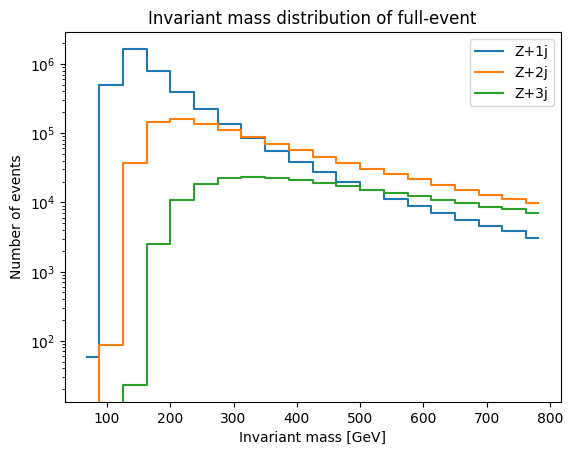

In [166]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(df_1["M_inv"], bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(df_2["M_inv"], bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(df_3["M_inv"], bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+3j', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

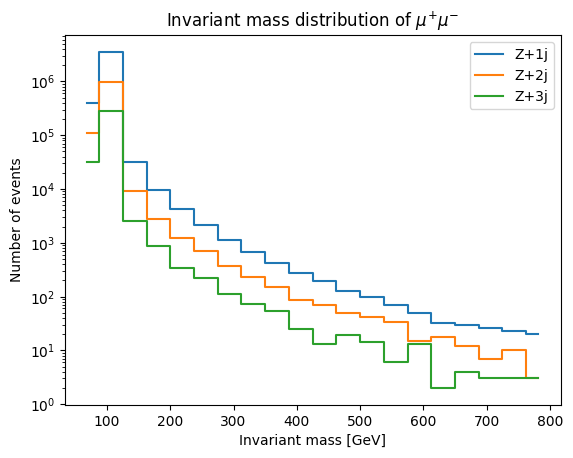

In [167]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

E_1=df1["E_mu1"]+df1["E_mu2"]
px_1=df1["px_mu1"]+df1["px_mu2"]
py_1=df1["py_mu1"]+df1["py_mu2"]
pz_1=df1["pz_mu1"]+df1["pz_mu2"]
M_inv_1=np.sqrt(E_1**2-px_1**2-py_1**2-pz_1**2)

E_2=df2["E_mu1"]+df2["E_mu2"]
px_2=df2["px_mu1"]+df2["px_mu2"]
py_2=df2["py_mu1"]+df2["py_mu2"]
pz_2=df2["pz_mu1"]+df2["pz_mu2"]
M_inv_2=np.sqrt(E_2**2-px_2**2-py_2**2-pz_2**2)

E_3=df3["E_mu1"]+df3["E_mu2"]
px_3=df3["px_mu1"]+df3["px_mu2"]
py_3=df3["py_mu1"]+df3["py_mu2"]
pz_3=df3["pz_mu1"]+df3["pz_mu2"]
M_inv_3=np.sqrt(E_3**2-px_3**2-py_3**2-pz_3**2)

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(M_inv_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(M_inv_2, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(M_inv_3, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+3j', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$')
plt.legend()
plt.show()

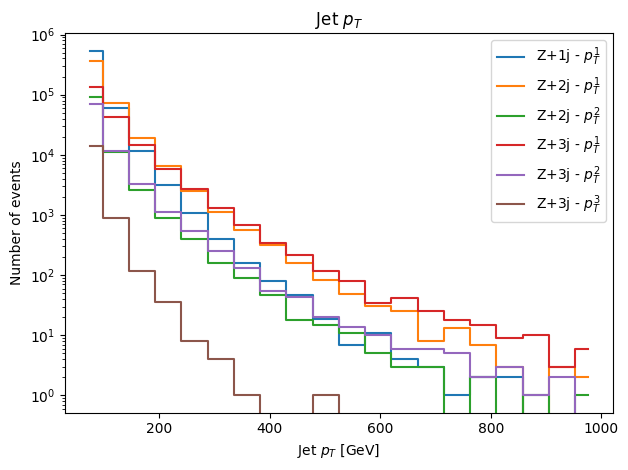

In [172]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 1000  # upper limit of the binning
num_bins = 20  # number of bins

pt1_1=np.sqrt(df1["px_j1"]**2+df1["py_j1"]**2)
pt2_1=np.sqrt(df2["px_j1"]**2+df2["py_j1"]**2)
pt2_2=np.sqrt(df2["px_j2"]**2+df2["py_j2"]**2)
pt3_1=np.sqrt(df3["px_j1"]**2+df3["py_j1"]**2)
pt3_2=np.sqrt(df3["px_j2"]**2+df3["py_j2"]**2)
pt3_3=np.sqrt(df3["px_j3"]**2+df3["py_j3"]**2)

# Create histogram values but do not plot it
counts1_1, _ = np.histogram(pt1_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2_1, _ = np.histogram(pt2_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2_2, _ = np.histogram(pt2_2, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3_1, _ = np.histogram(pt3_1, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3_2, _ = np.histogram(pt3_2, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3_3, bin_edges = np.histogram(pt3_3, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1_1, '-',label='Z+1j - $p_{T}^{1}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts2_1, '-',label='Z+2j - $p_{T}^{1}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts2_2, '-',label='Z+2j - $p_{T}^{2}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts3_1, '-',label='Z+3j - $p_{T}^{1}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts3_2, '-',label='Z+3j - $p_{T}^{2}$', drawstyle='steps-mid')
plt.plot(bin_centers, counts3_3, '-',label='Z+3j - $p_{T}^{3}$', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Jet $p_{T}$ [GeV]')
plt.ylabel('Number of events')
plt.title('Jet $p_{T}$')
plt.legend()
plt.tight_layout()
plt.show()

### Define datasets

In [48]:
try:
    df1 = df1.drop(['E_j2', 'px_j2', 'py_j2', 'pz_j2', 
                    'E_j3', 'px_j3', 'py_j3', 'pz_j3',
                    'E_cm', 'px_cm', 'py_cm', 'pz_cm','M_inv'], axis=1)
except:
    pass
try:
    df2 = df2.drop(['E_j3', 'px_j3', 'py_j3', 'pz_j3',
                    'E_cm', 'px_cm', 'py_cm', 'pz_cm','M_inv'], axis=1)
except:
    pass
try:
    df3 = df3.drop(['E_cm', 'px_cm', 'py_cm', 'pz_cm','M_inv'], axis=1)
except:
    pass
print("Datasets have shapes",[df1.shape,df2.shape,df3.shape],".")
print("Converting datasets to Numpy")
np1 = df1.to_numpy()
np2 = df2.to_numpy()
np3 = df3.to_numpy()
print("Saving datasets to file",events_dataset)
with h5py.File(events_dataset, 'w') as hdf:
    # Save the datasets into the file with unique names
    hdf.create_dataset('Z+1j', data=np1)
    hdf.create_dataset('Z+2j', data=np2)
    hdf.create_dataset('Z+3j', data=np3)

Datasets have shapes [(3987098, 12), (1110182, 16), (315904, 20)] .
Converting datasets to Numpy
Saving datasets to file ../ZplusJets/events/events.h5


In [49]:
events_dataset_path = "../ZplusJets/events/events.h5"

In [193]:
with h5py.File(events_dataset, 'r') as hdf:
    # Save the datasets into the file with unique names
    events = hdf['Z+1j'][:]

In [194]:
X_data_train = events[:nsamples]

In [36]:
X_data_train = np.concatenate([events[:nsamples,i:i+3] for i in range(1, len(events[0]), 4)])

In [389]:
nsamples=100000
X_data_train = events[:nsamples]
#X_data_train = np.concatenate([events[:nsamples,i:i+3] for i in range(1, len(events[0]), 4)],axis=1)
mean = X_data_train.mean(axis=0)
std = X_data_train.std(axis=0)
X_data_train_std = (X_data_train - mean) / std
X_data_train_std

array([[-0.5894242 ,  1.0665622 , -0.23791106, ..., -0.64648056,
         0.92785245,  1.1443974 ],
       [-0.60182774,  0.17789881, -1.1471243 , ...,  0.03183496,
         0.77463955,  0.43494526],
       [ 0.80458534,  0.8237812 , -0.26703933, ...,  0.76618266,
        -0.0725887 , -0.00395623],
       ...,
       [ 0.05453667, -1.2828187 , -0.12128814, ...,  3.2950537 ,
        -0.8842407 , -0.6393789 ],
       [-0.03357847, -0.98983854,  1.259915  , ...,  0.00704609,
        -1.2973218 , -0.04632529],
       [ 0.21433435, -1.2540814 ,  0.3043262 , ...,  0.5228074 ,
        -0.8902129 , -0.08950322]], dtype=float32)

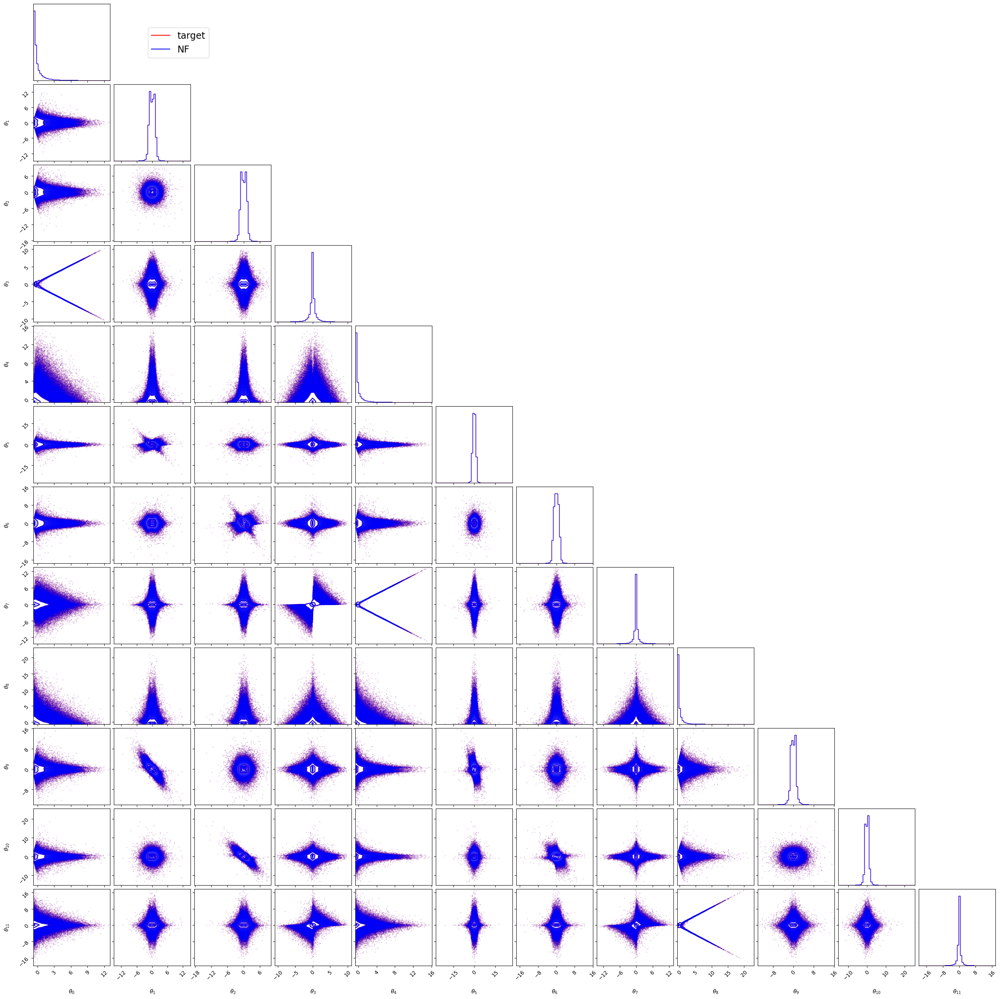

In [190]:
cornerplotter(X_data_train_std,X_data_train_std,max_dim=32)

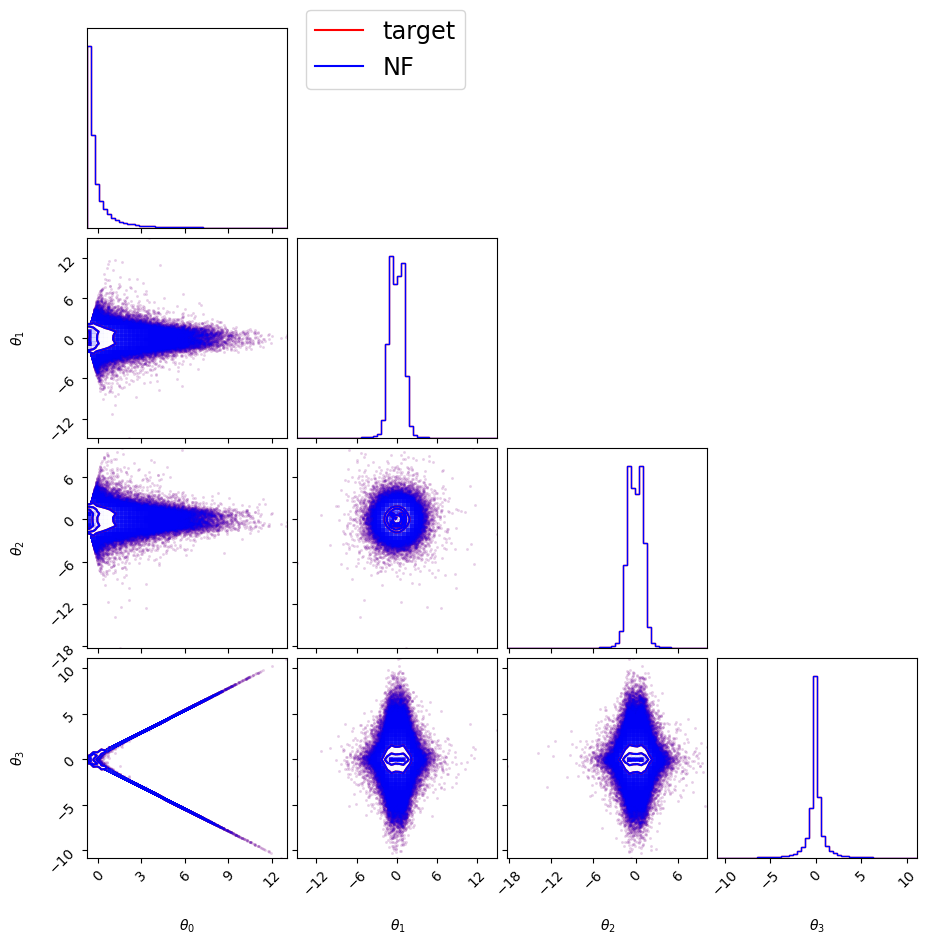

In [197]:
cornerplotter(X_data_train_std[:,:4],X_data_train_std[:,:4],max_dim=32)

##   Load data

In [2]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [3]:
nsamples=100000
X_data_train = events[:nsamples]
#X_data_train = np.concatenate([events[:nsamples,i:i+3] for i in range(1, len(events[0]), 4)],axis=1)
mean = X_data_train.mean(axis=0)
std = X_data_train.std(axis=0)
X_data_train_std = (X_data_train - mean) / std
X_data_train_std

array([[-0.5894242 ,  1.0665622 , -0.23791106, ..., -0.64648056,
         0.92785245,  1.1443974 ],
       [-0.60182774,  0.17789881, -1.1471243 , ...,  0.03183496,
         0.77463955,  0.43494526],
       [ 0.80458534,  0.8237812 , -0.26703933, ...,  0.76618266,
        -0.0725887 , -0.00395623],
       ...,
       [ 0.05453667, -1.2828187 , -0.12128814, ...,  3.2950537 ,
        -0.8842407 , -0.6393789 ],
       [-0.03357847, -0.98983854,  1.259915  , ...,  0.00704609,
        -1.2973218 , -0.04632529],
       [ 0.21433435, -1.2540814 ,  0.3043262 , ...,  0.5228074 ,
        -0.8902129 , -0.08950322]], dtype=float32)

# Lorents NFs

In [3]:
import numpy as np
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow_probability as tfp
import Lorentz

tfd = tfp.distributions
tfb = tfp.bijectors
tfpl = tfp.layers
tfk = tf.keras

## Pre-process data

In [4]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [5]:
nsamples=100000
X_data_train = tf.convert_to_tensor(events[:nsamples].astype(np.float64))
n_particles = int(X_data_train.shape[1]/4)
# Reshape the data to isolate the energies and momenta
reshaped_data = tf.reshape(X_data_train, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute mean energy
mean_energy = tf.reduce_mean(energies)
# Rescale all 4-momenta components by mean energy
X_data_train_std = X_data_train/mean_energy
###
###
# And now compute means3mom and stdev3mom
reshaped_data = tf.reshape(X_data_train_std, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute the means
mean_energy = tf.reduce_mean(energies)
mean_px = tf.reduce_mean(px)
mean_py = tf.reduce_mean(py)
mean_pz = tf.reduce_mean(pz)
# Compute the standard deviations
std_energy = tf.math.reduce_std(energies)
std_px = tf.math.reduce_std(px)
std_py = tf.math.reduce_std(py)
std_pz = tf.math.reduce_std(pz)
# Combine the means and standard deviations of px, py, and pz
means3mom = tf.stack([mean_px, mean_py, mean_pz], axis=-1)
stdev3mom = tf.stack([std_px, std_py, std_pz], axis=-1)

## Check the BaseDistribution

In [6]:
base_dist64 = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom,dtype=tf.float64)
base_dist32 = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom,dtype=tf.float32)
samples64 = base_dist64.sample(100000)
samples32 = base_dist32.sample(100000)
#samples
log_probs64 = base_dist64.log_prob(samples64)
log_probs32 = base_dist32.log_prob(samples32)
[samples64,log_probs64,"\n",samples32,log_probs32]

[<tf.Tensor: shape=(100000, 12), dtype=float64, numpy=
 array([[ 2.74340933,  0.11300833,  0.07087314, ..., -0.32946351,
         -0.03114619,  3.47814754],
        [ 1.13825258,  0.16815574,  0.08727387, ..., -0.34560834,
         -0.25582079,  0.09898002],
        [ 0.54614558, -0.01608992,  0.11942952, ...,  0.1531388 ,
         -0.24009868, -2.01135847],
        ...,
        [ 0.90958879,  0.25144363, -0.17665269, ..., -0.41860764,
          0.27411647,  0.89212179],
        [ 2.17827123, -0.22624095, -0.03246208, ...,  0.50041254,
         -0.06573937, -0.71428789],
        [ 1.40474749,  0.01772909, -0.19397216, ..., -0.14078167,
         -0.08627053,  2.60502888]])>,
 <tf.Tensor: shape=(100000,), dtype=float64, numpy=
 array([-5.30156665, -3.28801447, -3.24772372, ..., -3.69655651,
        -4.43929261, -7.02946217])>,
 '\n',
 <tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 1.5691955e+00, -5.9220158e-02,  8.8521659e-02, ...,
          1.5812734e-01, -2.1562010e-01

In [7]:
Lorentz.check_4momentum_conservation(samples32[:5])

The event contains 5 particles
Checking energy-momentum conservation for each event...


{'event:0': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:1': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:2': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:3': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:4': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False}}

In [10]:
base_dist64.masses

<tf.Tensor: shape=(3,), dtype=float64, numpy=array([0., 0., 0.])>

In [11]:
Lorentz.compute_masses(samples64[:20])

The event contains 20 particles
Computing masses from on-shell condition


{'event:0': array([0., 0., 0.]),
 'event:1': array([0., 0., 0.]),
 'event:2': array([0., 0., 0.]),
 'event:3': array([0., 0., 0.]),
 'event:4': array([0., 0., 0.]),
 'event:5': array([0., 0., 0.]),
 'event:6': array([0., 0., 0.]),
 'event:7': array([0., 0., 0.]),
 'event:8': array([0., 0., 0.]),
 'event:9': array([0., 0., 0.]),
 'event:10': array([0., 0., 0.]),
 'event:11': array([0., 0., 0.]),
 'event:12': array([0., 0., 0.]),
 'event:13': array([0., 0., 0.]),
 'event:14': array([0., 0., 0.]),
 'event:15': array([0., 0., 0.]),
 'event:16': array([0., 0., 0.]),
 'event:17': array([0., 0., 0.]),
 'event:18': array([0., 0., 0.]),
 'event:19': array([0., 0., 0.])}

In [56]:
n_particles = int(X_data_train_std.shape[1]/4)
hidden_units = [128, 128, 128]
activation = 'relu'
num_bijectors = max(n_particles, len(hidden_units))

lorentz_transform_NN32 = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                    activation = activation,
                                                    dtype = "float32")
lorentz_transform_NN = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                    activation = activation,
                                                    dtype = tf.float64)

x32 = samples32[:5]
x = samples64[:5]

parameters = lorentz_transform_NN(x) # shape: (n_samples, 6)
#print(parameters)
#parameters_expanded = tf.expand_dims(parameters, axis=1) # shape: (n_samples, 1, 6)
#parameters_extended = tf.tile(parameters_expanded, [1, n_particles, 1]) # shape: (n_samples, n_particles, 6)
beta_x = parameters[..., 0]  # Velocity for boost in the x direction (ranges from -1 to 1). shape (n_samples,)
beta_y = parameters[..., 1]  # Velocity for boost in the y direction (ranges from -1 to 1). shape (n_samples,)
beta_z = parameters[..., 2]  # Velocity for boost in the z direction (ranges from -1 to 1). shape (n_samples,)
theta_1 = parameters[..., 3]  # Euler angle 1: rotation around z-axis. shape (n_samples,)
theta_2 = parameters[..., 4]  # Euler angle 2: rotation around y-axis. shape (n_samples,)
theta_3 = parameters[..., 5]  # Euler angle 3: rotation around new z-axis. shape (n_samples,)

rotation = Lorentz.euler_rotation(theta_1, theta_2, theta_3)
boost = Lorentz.lorentz_boost(beta_x, beta_y, beta_z)

# Check unitarity and determinant of the boost matrix
print("\nChecking unitarity and determinant of the boost matrix")
# Identity tensor with the same shape
UUm1 = np.matmul(np.linalg.inv(boost.numpy()),boost.numpy())
detU = np.linalg.det(boost.numpy())
identity_tens = tf.eye(4, batch_shape=[UUm1.shape[0]], dtype=UUm1.dtype)
diff = UUm1-identity_tens
diff_det = detU-np.ones(len(detU))
max_diff = tf.reduce_max(tf.abs(diff)).numpy()
max_diff_det = tf.reduce_max(tf.abs(diff_det)).numpy()
print("The maximum value in the difference between identity matrices and U.U^{-1} is:", max_diff)
print("The determinants of Us are:", max_diff_det)

# Check unitarity and determinant of the rotation matrix
print("\nCheck unitarity and determinant of the rotation matrix")
# Identity tensor with the same shape
UUm1 = np.matmul(np.linalg.inv(rotation.numpy()),rotation.numpy())
detU = np.linalg.det(rotation.numpy())
identity_tens = tf.eye(4, batch_shape=[UUm1.shape[0]], dtype=UUm1.dtype)
diff = UUm1-identity_tens
diff_det = detU-np.ones(len(detU))
max_diff = tf.reduce_max(tf.abs(diff)).numpy()
max_diff_det = tf.reduce_max(tf.abs(diff_det)).numpy()
print("The maximum value in the difference between identity matrices and U.U^{-1} is:", max_diff)
print("The determinants of Us are:", max_diff_det)

print("\n=============================================\n")
print("\nFirst event before transformations:",x[0])
print("\nMasses before transformations:",Lorentz.compute_masses(x))
print("Check momentum conserations before transformations:", Lorentz.check_4momentum_conservation(x))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)

print("\n=============================================\n")
print("\nApplying the boost")
x_transformed = Lorentz.apply_lorentz_transformation(x, boost)
print("First event after boost:",x_transformed[0])
print("\nMasses after the boost are:",Lorentz.compute_masses(x_transformed))
print("Check momentum conserations after the boost:", Lorentz.check_4momentum_conservation(x_transformed))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_transformed,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_transformed,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)

print("\n=============================================\n")
print("\nApplying also the rotation")
x_transformed = Lorentz.apply_lorentz_transformation(x_transformed, rotation)
print("First event after boost and rotation:",x_transformed[0])
print("\nMasses after the boost and the rotation are:",Lorentz.compute_masses(x_transformed))
print("Check momentum conserations after the boost and the rotation are:", Lorentz.check_4momentum_conservation(x_transformed))
minv = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_transformed,[5,3,4]),axis=1))
minv_mu = Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x_transformed,[5,3,4])[:,:2,:],axis=1))
print("\nTotal invariant mass before transformations is:", minv)
print("Invariant mass of muons before transformations is:", minv_mu)


Checking unitarity and determinant of the boost matrix
The maximum value in the difference between identity matrices and U.U^{-1} is: 2.220446049250313e-16
The determinants of Us are: 2.220446049250313e-16

Check unitarity and determinant of the rotation matrix
The maximum value in the difference between identity matrices and U.U^{-1} is: 2.220446049250313e-16
The determinants of Us are: 2.220446049250313e-16



First event before transformations: tf.Tensor(
[ 2.74340933  0.11300833  0.07087314  2.74016439  0.73823061  0.21645518
 -0.03972696  0.70466542  3.49385555 -0.32946351 -0.03114619  3.47814754], shape=(12,), dtype=float64)
The event contains 5 particles
Computing masses from on-shell condition

Masses before transformations: {'event:0': array([0., 0., 0.]), 'event:1': array([0., 0., 0.]), 'event:2': array([0., 0., 0.]), 'event:3': array([0., 0., 0.]), 'event:4': array([0., 0., 0.])}
The event contains 5 particles
Checking energy-momentum conservation for each event...
Check mo

In [52]:
tf.reshape(x,[5,3,4])[:,:2,:]

<tf.Tensor: shape=(5, 2, 4), dtype=float64, numpy=
array([[[ 2.74340933,  0.11300833,  0.07087314,  2.74016439],
        [ 0.73823061,  0.21645518, -0.03972696,  0.70466542]],

       [[ 1.13825258,  0.16815574,  0.08727387,  1.12237509],
        [ 1.53739123,  0.1774526 ,  0.16854691,  1.51778599]],

       [[ 0.54614558, -0.01608992,  0.11942952, -0.53268443],
        [ 2.18621747, -0.13704889,  0.12066916, -2.17857829]],

       [[ 1.52224744, -0.0392812 , -0.11075119,  1.51770499],
        [ 0.20583903, -0.10071119, -0.0398576 , -0.1750381 ]],

       [[ 0.56354173, -0.07166811,  0.35062925, -0.43531838],
        [ 0.54625406,  0.03919132, -0.0452649 ,  0.54296282]]])>

In [49]:
Lorentz.compute_masses(tf.reduce_sum(tf.reshape(x[:,:3,:],[5,2,4]),axis=1))

2023-06-13 20:11:50.590547: W tensorflow/core/framework/op_kernel.cc:1745] OP_REQUIRES failed at strided_slice_op.cc:108 : INVALID_ARGUMENT: Index out of range using input dim 2; input has only 2 dims


InvalidArgumentError: Index out of range using input dim 2; input has only 2 dims [Op:StridedSlice] name: strided_slice/

In [8]:
rotation = Lorentz.euler_rotation(0., 0., 0.)
rotation
boost = Lorentz.lorentz_boost(0., 0., 0.)
boost

<tf.Tensor: shape=(1, 4, 4), dtype=float32, numpy=
array([[[ 1.,  0.,  0.,  0.],
        [-0.,  1.,  0.,  0.],
        [-0.,  0.,  1.,  0.],
        [ 0.,  0.,  0.,  1.]]], dtype=float32)>

In [10]:
rotation = Lorentz.euler_rotation(theta_1, theta_2, theta_3)

In [15]:
[Lorentz.compute_masses(x),Lorentz.compute_masses(x_transformed)]

The event contains 5 particles
Computing masses from on-shell condition
The event contains 5 particles
Computing masses from on-shell condition


[{'event:0': array([0., 0., 0.], dtype=float32),
  'event:1': array([0., 0., 0.], dtype=float32),
  'event:2': array([0., 0., 0.], dtype=float32),
  'event:3': array([0., 0., 0.], dtype=float32),
  'event:4': array([0., 0., 0.], dtype=float32)},
 {'event:0': array([nan,  0.,  0.], dtype=float32),
  'event:1': array([0.        , 0.        , 0.00119604], dtype=float32),
  'event:2': array([0., 0., 0.], dtype=float32),
  'event:3': array([ 0.,  0., nan], dtype=float32),
  'event:4': array([ 0., nan, nan], dtype=float32)}]

In [15]:
samples = samples32

In [ ]:
Lorentz.euler_rotation()

In [ ]:
transformed = tf.linalg.matvec(transformation_matrix, x) # shape: (n_samples, n_particles, 3)

In [108]:
zeros

<tf.Tensor: shape=(5,), dtype=float32, numpy=array([0., 0., 0., 0., 0.], dtype=float32)>

In [162]:
boost_matrix[0]

<tf.Tensor: shape=(4, 4), dtype=float32, numpy=
array([[ 1.0393294 ,  0.0598891 ,  0.01925959,  0.2761302 ],
       [ 0.0598891 ,  1.0338845 ,  0.0026078 , -0.01144643],
       [ 0.01925959,  0.0026078 ,  1.0001819 ,  0.0026078 ],
       [ 0.2761302 , -0.01144643,  0.0026078 ,  1.0373888 ]],
      dtype=float32)>

[array([[[ 1.0000000e+00, -1.0192798e-11,  7.1160564e-12, -4.8375348e-10],
         [ 2.7881617e-11,  1.0000000e+00,  1.4478131e-14, -2.5248987e-13],
         [ 1.6600894e-11,  2.7977403e-13,  9.9999994e-01, -2.9159401e-13],
         [ 4.8695092e-10,  2.3827468e-12,  2.5394010e-13,  1.0000000e+00]],
 
        [[ 1.0000000e+00, -1.0192798e-11,  7.1160564e-12, -4.8375348e-10],
         [ 2.7881617e-11,  1.0000000e+00,  1.4478131e-14, -2.5248987e-13],
         [ 1.6600894e-11,  2.7977403e-13,  9.9999994e-01, -2.9159401e-13],
         [ 4.8695092e-10,  2.3827468e-12,  2.5394010e-13,  1.0000000e+00]],
 
        [[ 1.0000000e+00, -1.0192798e-11,  7.1160564e-12, -4.8375348e-10],
         [ 2.7881617e-11,  1.0000000e+00,  1.4478131e-14, -2.5248987e-13],
         [ 1.6600894e-11,  2.7977403e-13,  9.9999994e-01, -2.9159401e-13],
         [ 4.8695092e-10,  2.3827468e-12,  2.5394010e-13,  1.0000000e+00]]],
       dtype=float32),
 array([1.0000721, 1.0000721, 1.0000721], dtype=float32)]

In [13]:
samples_rotated = Lorentz.euler_rotation(samples[:5], alpha, beta, gamma)
samples_rotated

NameError: name 'samples' is not defined

In [37]:
Lorentz.check_4momentum_conservation(samples_rotated)

The event contains 5 particles
Checking energy-momentum conservation for each event...


{'event:0': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:1': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:2': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:3': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:4': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False}}

In [38]:
Lorentz.compute_masses(samples_rotated)

The event contains 5 particles
Computing masses from on-shell condition


{'event:0': array([nan, nan, nan], dtype=float32),
 'event:1': array([       nan, 0.08648593, 0.36821458], dtype=float32),
 'event:2': array([       nan, 0.68466246, 0.23537098], dtype=float32),
 'event:3': array([0.7949959,       nan,       nan], dtype=float32),
 'event:4': array([       nan,        nan, 0.09563194], dtype=float32)}

### Plots

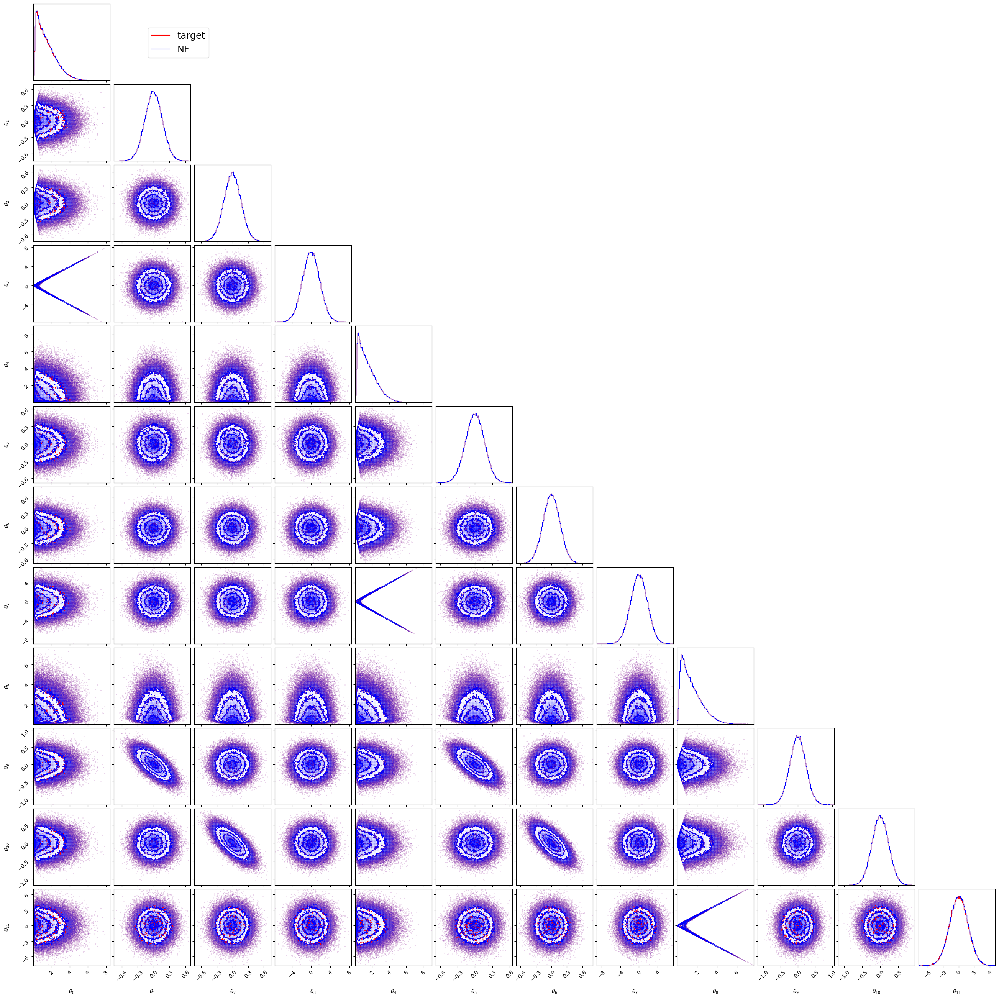

In [9]:
samples_np = samples.numpy()
Lorentz.cornerplotter(samples_np,samples_np,max_dim=32,n_bins=100)

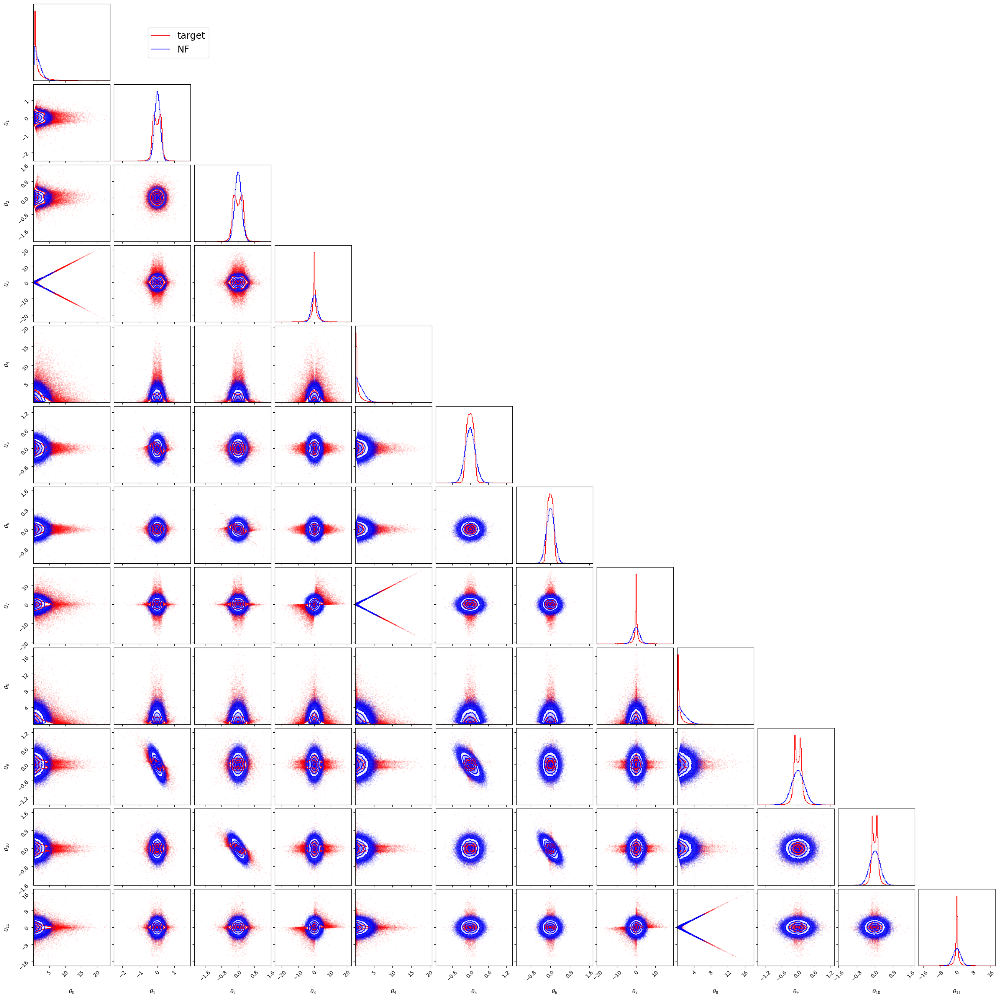

In [26]:
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np,max_dim=32,n_bins=100)

In [10]:
# Compute the total final state invariant mass
total_minv_true = invariant_mass(X_data_train_std*mean_energy)
total_minv_base = invariant_mass(samples*mean_energy)

# Compute the invariant mass of the first two particles
muons_minv_true = invariant_mass((X_data_train_std*mean_energy)[:, :8])
muons_minv_base = invariant_mass((samples*mean_energy)[:, :8])

In [11]:
total_minv_true

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([1.3277134 , 0.88539267, 0.95430243, ..., 2.3875809 , 1.1124071 ,
       0.8133743 ], dtype=float32)>

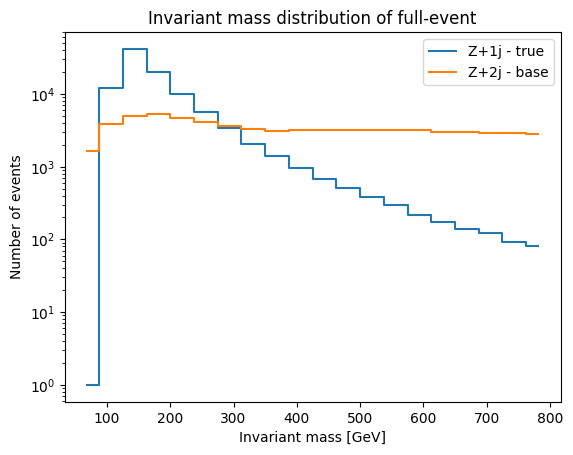

In [61]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(total_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(total_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

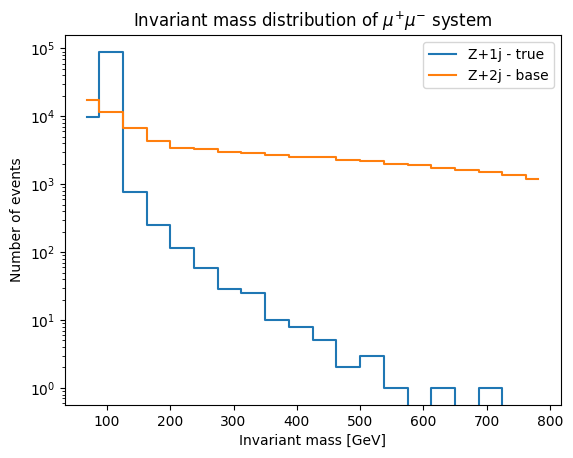

In [62]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(muons_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(muons_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$ system')
plt.legend()
plt.show()

## Build and check single bijector

In [22]:
n_particles = int(X_data_train_std.shape[1]/4)
hidden_units = [24, 24, 24]
activation = 'relu'
num_bijectors = max(n_particles, len(hidden_units))

lorentz_transform_NN = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                  activation = activation)
bijector = Lorentz.GeneralLorentzTransformBijector(n_particles = n_particles, 
                                                   lorentz_transform_NN = lorentz_transform_NN)

In [23]:
x = samples

x_reshaped = tf.reshape(x,[-1,3,4])
x_particle = x_reshaped[:, 0, :]  # Use the first particle's 4-momentum

parameters = lorentz_transform_NN(x_reshaped)
print(parameters)

tf.Tensor(
[[[-0.02021513  3.149875    3.163931    3.1591077   3.1142077
    3.1135306 ]
  [-0.48914728  3.6535742   3.2260718   3.3558726   2.3473141
    2.7829316 ]
  [-0.35896564  3.5013802   3.2025878   3.2884238   2.4849658
    2.851192  ]]

 [[ 0.08150694  3.15603     3.2303066   3.2301836   3.09538
    3.0361893 ]
  [-0.17051134  3.25475     3.1779563   3.1697276   2.9515471
    2.9921834 ]
  [-0.60025233  3.8831122   3.2888703   3.5935955   1.849568
    2.7672498 ]]

 [[ 0.18921985  3.144233    3.2830107   3.3343396   3.07903
    2.887814  ]
  [-0.52951497  3.7734153   3.2768722   3.5431774   2.0095105
    2.8304665 ]
  [-0.17643993  3.3627477   3.182731    3.3225822   2.703099
    3.0829554 ]]

 ...

 [[ 0.1842666   3.1705642   3.3081603   3.3780763   3.0541172
    2.8615234 ]
  [-0.10595255  3.2805064   3.1639946   3.2459338   2.8759296
    3.1041825 ]
  [-0.21670523  3.31535     3.1801808   3.1958125   2.8597007
    2.9666994 ]]

 [[ 0.18696268  3.1730063   3.3384228   3.346

In [24]:
Lorentz.compute_masses(x[0])

The event contains 12 particles
Computing masses from on-shell condition


{'event:0': array([nan, nan, nan], dtype=float32)}

In [25]:
base_dist = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom)

In [26]:
nf_dist = tfd.TransformedDistribution(base_dist,bijector)

In [16]:
samples = nf_dist.sample(100)
#samples
log_probs = nf_dist.log_prob(samples)
[samples,log_probs]

[<tf.Tensor: shape=(100, 12), dtype=float32, numpy=
 array([[ 3.82155061e-01,  2.79099613e-01,  2.51364380e-01, ...,
         -2.88759619e-01, -3.41618776e-01,  1.62343550e+00],
        [ 8.90619099e-01,  1.90411493e-01,  2.22514763e-01, ...,
         -6.98792100e-01, -1.07744895e-01,  2.96335125e+00],
        [ 2.04148102e+00,  6.26209080e-01,  5.09411618e-02, ...,
         -3.27611864e-01,  9.23510045e-02,  8.31093013e-01],
        ...,
        [ 2.22337174e+00,  1.11119300e-01, -1.16678059e-01, ...,
          1.80417433e-01,  5.32108359e-04,  9.21036780e-01],
        [ 2.01151514e+00,  3.06770593e-01,  3.01618636e-01, ...,
          1.88332781e-01, -3.46201122e-01, -5.14199018e-01],
        [ 9.62653458e-01,  1.74406856e-01,  3.19845080e-01, ...,
         -1.02166831e-01, -4.34291750e-01, -3.63742292e-01]], dtype=float32)>,
 <tf.Tensor: shape=(100,), dtype=float32, numpy=
 array([ -5.246894 ,  -5.88386  ,  -3.7166467,  -8.071373 ,  -7.033593 ,
         -4.0853124,  -2.548708 ,  -4.2

In [17]:
Lorentz.check_4momentum_conservation(samples[:5])

The event contains 5 particles
Checking energy-momentum conservation for each event...


{'event:0': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:1': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:2': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:3': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False},
 'event:4': {'energy': False,
  'momentum_x': False,
  'momentum_y': False,
  'momentum_z': False}}

In [20]:
Lorentz.compute_squared_masses(samples[:10])

The event contains 10 particles
Computing squared masses from on-shell condition


{'event:0': array([-0.00461041, -0.6249223 , -0.32994533], dtype=float32),
 'event:1': array([-0.01116741,  0.00747985,  0.13558006], dtype=float32),
 'event:2': array([-0.29015136,  0.46876287,  0.05539954], dtype=float32),
 'event:3': array([ 0.6320181, -0.3190937, -0.6381359], dtype=float32),
 'event:4': array([-0.01949573, -0.00729865,  0.00914547], dtype=float32),
 'event:5': array([-6.411358 ,  0.0670947,  0.683713 ], dtype=float32),
 'event:6': array([-0.7380675 ,  1.1943204 ,  0.40268248], dtype=float32),
 'event:7': array([-0.16437134, -2.3237567 ,  0.4397403 ], dtype=float32),
 'event:8': array([ 0.10811728,  0.34400988, -0.11008328], dtype=float32),
 'event:9': array([-0.00332464,  0.01662536,  0.01286584], dtype=float32)}

### Plots

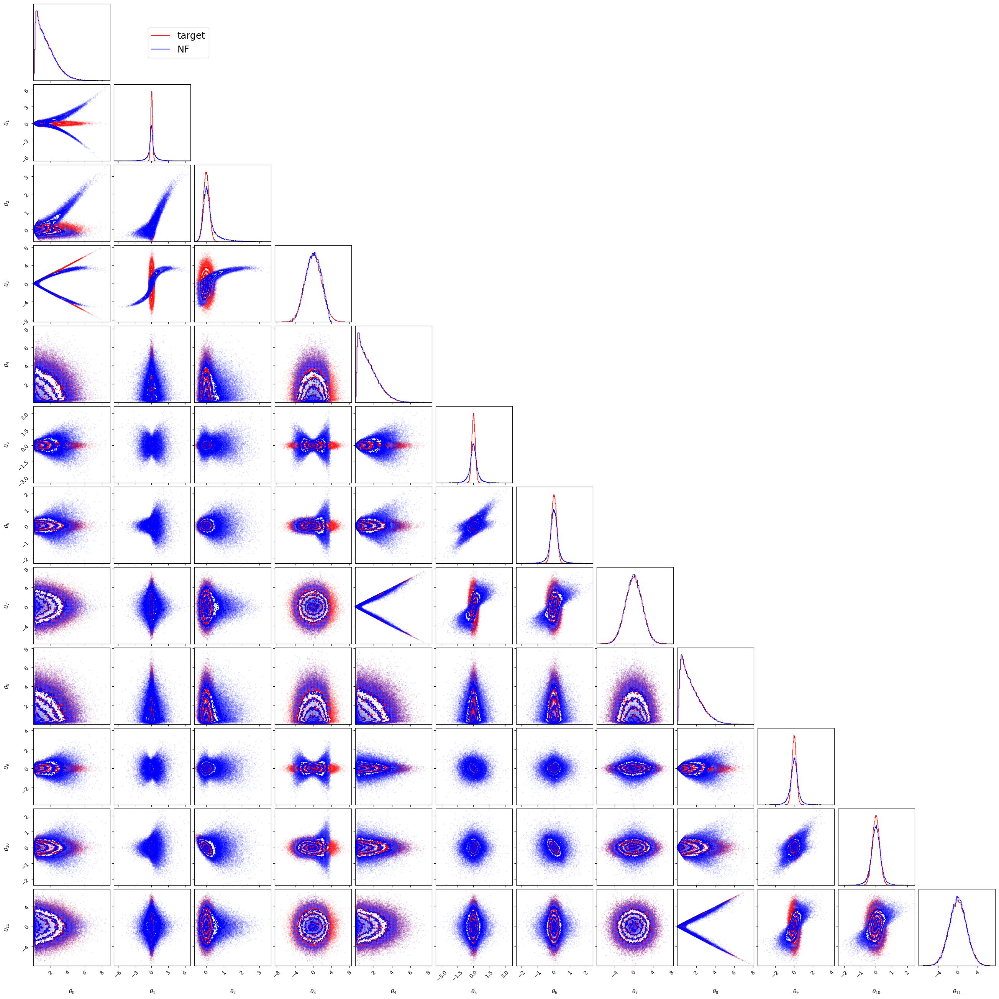

In [74]:
samples_np = samples.numpy()
x_forward_np = x_forward.numpy()
Lorentz.cornerplotter(samples_np,x_forward_np,max_dim=32,n_bins=100)

In [69]:
# Compute the total final state invariant mass
total_minv_forward = invariant_mass(x_forward*mean_energy).numpy()

# Compute the invariant mass of the first two particles
muons_minv_forward = invariant_mass((x_forward*mean_energy)[:, :8]).numpy()

In [68]:
total_minv_forward

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([885.20044, 963.7149 , 366.9284 , ..., 565.533  , 130.2464 ,
       641.33386], dtype=float32)>

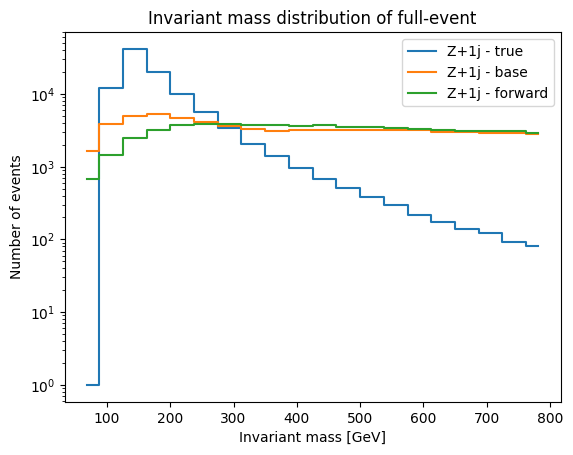

In [71]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(total_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(total_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(total_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+1j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

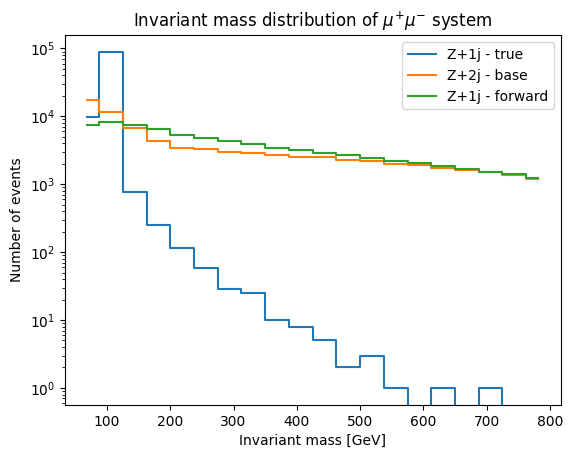

In [72]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(muons_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(muons_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(muons_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$ system')
plt.legend()
plt.show()

## Build the NF

In [11]:
n_particles = int(X_data_train_std.shape[1]/4)
hidden_units = [128, 128, 128]
activation = 'relu'
num_bijectors = max(n_particles, len(hidden_units))

lorentz_transform_NN = Lorentz.LorentzTransformNN(hidden_units = hidden_units, 
                                                  activation = activation)
bijector = Lorentz.GeneralLorentzTransformBijector(n_particles = n_particles, 
                                                   lorentz_transform_NN = lorentz_transform_NN)

In [12]:
X_data_train_std[0:2]

<tf.Tensor: shape=(2, 12), dtype=float64, numpy=
array([[ 0.30168362,  0.23200632, -0.05251492, -0.18554854,  0.17628888,
        -0.10887511, -0.04592706,  0.1308231 ,  1.42090907, -0.0917711 ,
         0.13380981,  1.41144724],
       [ 0.27820016,  0.03808023, -0.25063701, -0.11457013,  0.16621251,
        -0.06794783,  0.14958197,  0.02519771,  0.54740016,  0.00555921,
         0.11179432,  0.53554068]])>

In [13]:
# Debugging permutations
n_particles = int(X_data_train_std.shape[1]/4)
for i in range(10):
    n_bijectors = n_particles+i
    hidden_layers = [128, 128, 128]
    activation = 'relu'
    num_bijectors = max(n_particles, len(hidden_layers))
    
    flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                                 n_bijectors = n_bijectors, 
                                                 hidden_units = hidden_units, 
                                                 activation = activation,
                                                 permute_only = True)
    try:
        tf.debugging.assert_near(X_data_train_std, flow(X_data_train_std), atol=1e-06)
        print("n_bijectors = ",n_bijectors,"works.")
    except:
        print("n_bijectors = ",n_bijectors,"does not work.")

n_bijectors =  3 works.
n_bijectors =  4 works.
n_bijectors =  5 works.
n_bijectors =  6 works.
n_bijectors =  7 works.
n_bijectors =  8 works.
n_bijectors =  9 works.
n_bijectors =  10 works.
n_bijectors =  11 works.
n_bijectors =  12 works.


In [14]:
flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                                 n_bijectors = n_bijectors, 
                                                 hidden_units = hidden_units, 
                                                 activation = activation,
                                                 permute_only = False)

In [16]:
# Apply forward transformation
x_forward = flow.flow.forward(x)
print(tf.shape(x_forward))

# Check if output shape matches input shape
assert x.shape == x_forward.shape, "Output shape does not match input shape in forward transformation."
#
## Apply inverse transformation
x_inverse = flow.flow.inverse(x_forward)
print(tf.shape(x_inverse))
#
# Check if the inverse of the forward transform matches the original input
assert tf.reduce_all(tf.abs(x - x_inverse) < 1e-6), "Inverse of forward transform does not match original input."

tf.Tensor([100000     12], shape=(2,), dtype=int32)
tf.Tensor([100000     12], shape=(2,), dtype=int32)


### Plots

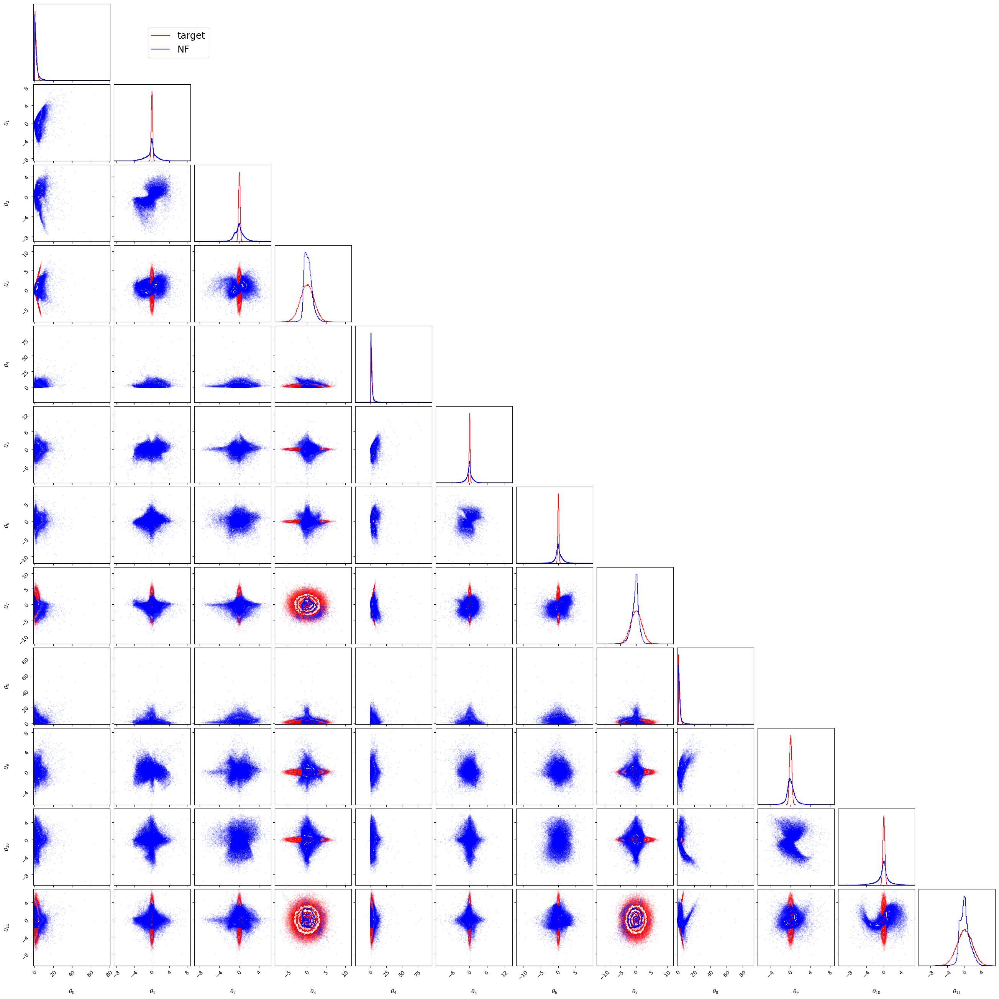

In [21]:
samples_np = samples.numpy()
x_forward_np = x_forward.numpy()
Lorentz.cornerplotter(samples_np,x_forward_np,max_dim=32,n_bins=100)

In [22]:
# Compute the total final state invariant mass
total_minv_forward = invariant_mass(x_forward*mean_energy).numpy()

# Compute the invariant mass of the first two particles
muons_minv_forward = invariant_mass((x_forward*mean_energy)[:, :8]).numpy()

In [23]:
total_minv_forward

array([4.9389997, 0.       , 4.326925 , ..., 4.1869583, 0.963303 ,
       5.5954947], dtype=float32)

In [24]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(total_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(total_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(total_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+1j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of full-event')
plt.legend()
plt.show()

NameError: name 'total_minv_true' is not defined

In [ ]:
scale = 'log'
min_mass = 50  # lower limit of the binning
max_mass = 800  # upper limit of the binning
num_bins = 20  # number of bins

# Create histogram values but do not plot it
counts1, bin_edges = np.histogram(muons_minv_true, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts2, _ = np.histogram(muons_minv_base, bins=np.linspace(min_mass, max_mass, num_bins + 1))
counts3, _ = np.histogram(muons_minv_forward, bins=np.linspace(min_mass, max_mass, num_bins + 1))

# Get the bin centers
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2

# Draw the plot
plt.plot(bin_centers, counts1, '-',label='Z+1j - true', drawstyle='steps-mid')
plt.plot(bin_centers, counts2, '-',label='Z+2j - base', drawstyle='steps-mid')
plt.plot(bin_centers, counts3, '-',label='Z+1j - forward', drawstyle='steps-mid')
plt.yscale(scale)
plt.xlabel('Invariant mass [GeV]')
plt.ylabel('Number of events')
plt.title('Invariant mass distribution of $\mu^{+}\mu^{-}$ system')
plt.legend()
plt.show()

## Full script for full architecture

In [5]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [6]:
nsamples = 100000
ndims = events.shape[1]
X_data_train = tf.convert_to_tensor(events[:nsamples])
n_particles = int(X_data_train.shape[1]/4)
# Reshape the data to isolate the energies and momenta
reshaped_data = tf.reshape(X_data_train, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute mean energy
mean_energy = tf.reduce_mean(energies)
# Rescale all 4-momenta components by mean energy
X_data_train_std = X_data_train/mean_energy
###
###
# And now compute means3mom and stdev3mom
reshaped_data = tf.reshape(X_data_train_std, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute the means
mean_energy = tf.reduce_mean(energies)
mean_px = tf.reduce_mean(px)
mean_py = tf.reduce_mean(py)
mean_pz = tf.reduce_mean(pz)
# Compute the standard deviations
std_energy = tf.math.reduce_std(energies)
std_px = tf.math.reduce_std(px)
std_py = tf.math.reduce_std(py)
std_pz = tf.math.reduce_std(pz)
# Combine the means and standard deviations of px, py, and pz
means3mom = tf.stack([mean_px, mean_py, mean_pz], axis=-1)
stdev3mom = tf.stack([std_px, std_py, std_pz], axis=-1)

In [7]:
base_dist = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom)

In [8]:
base_dist.log_prob(X_data_train)

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([ -68992.08,  -74002.15, -104883.08, ...,  -81927.95, -132147.5 ,
       -118430.2 ], dtype=float32)>

In [14]:
n_particles = int(X_data_train_std.shape[1]/4)
n_bijectors = 21#3*n_particles
hidden_units = [64, 64, 64]
activation = 'relu'

flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                             n_bijectors = n_bijectors, 
                                             hidden_units = hidden_units, 
                                             activation = activation,
                                             permute_only = False)

In [15]:
nf_dist = tfd.TransformedDistribution(base_dist,flow)

In [16]:
samples = nf_dist.sample(100000)
log_probs = nf_dist.log_prob(samples)
[samples,log_probs]

[<tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 2.30764818e+00, -1.15154052e+00, -3.34393263e-01, ...,
         -1.23548830e+00,  8.43893945e-01,  2.40085334e-01],
        [ 5.21737278e-01,  2.02155322e-01,  2.59686947e-01, ...,
         -3.90158653e-01, -1.11556542e+00,  5.05217552e-01],
        [ 2.93970737e+01,  6.97323895e+00,  1.70937824e+00, ...,
         -1.24670839e+00, -8.04007828e-01,  3.68446827e-01],
        ...,
        [ 6.31655082e-02, -1.01680398e-01,  5.82692623e-02, ...,
          1.16395690e-01, -1.30720865e-02,  6.62324429e-02],
        [ 3.54008496e-01, -2.11430669e-01,  2.26982266e-01, ...,
          3.77433635e-02, -3.36256742e-01,  4.45202500e-01],
        [ 2.49929726e-01,  4.29069340e-01, -2.34960437e-01, ...,
          2.25609899e+00, -1.01030350e+00,  2.35870183e-01]], dtype=float32)>,
 <tf.Tensor: shape=(100000,), dtype=float32, numpy=
 array([-8.767613 , -3.7417965, -6.317663 , ..., -1.7681818, -2.9206982,
        -3.447098 ], dtype=float3

In [10]:
samples_np = samples.numpy()
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np,max_dim=32,n_bins=100)

KeyboardInterrupt: 

In [17]:
nf_dist.log_prob(X_data_train)

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([-4.0588930e+12, -9.8748865e+11, -1.1024633e+13, ...,
       -6.3112489e+09, -5.3050170e+12, -1.0075413e+13], dtype=float32)>

In [18]:
n_epochs = 10
batch_size = 512

history, training_time = Trainer.graph_execution(ndims = ndims,
                                                 trainable_distribution = nf_dist,
                                                 X_data = X_data_train_std,
                                                 n_epochs = n_epochs, 
                                                 batch_size = batch_size, 
                                                 n_disp = 1, 
                                                 path_to_results = results_path,
                                                 load_weights = False, 
                                                 load_weights_path=None, 
                                                 lr=.0001, 
                                                 patience=30, 
                                                 min_delta_patience=0.001, 
                                                 reduce_lr_factor=0.2, 
                                                 seed=0, 
                                                 stop_on_nan=False)

KerasTensor(type_spec=TensorSpec(shape=(None, 12), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")
####### log_prob####
KerasTensor(type_spec=TensorSpec(shape=(None,), dtype=tf.float32, name=None), name='tf.__operators__.add_338/AddV2:0', description="created by layer 'tf.__operators__.add_338'")
Epoch 1/5

 Epoch 1/5 
	 loss: 21560.3906, val_loss: 13303.7969

Epoch 00001: val_loss improved from inf to 13303.79688, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 72s - loss: 21560.3906 - val_loss: 13303.7969 - lr: 1.0000e-04 - 72s/epoch - 524ms/step
Epoch 2/5

 Epoch 2/5 
	 loss: 18100.2090, val_loss: 10848.8887

Epoch 00002: val_loss improved from 13303.79688 to 10848.88867, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 36s - loss: 18100.2090 - val_loss: 10848.8887 - lr: 1.0000e-04 - 36s/epoch - 262ms/step
Epoch 3/5

 Epoch 3/5 
	 loss: 9159.6143, val_loss: 6501.2139

Epoch 00

In [ ]:
nf_dist.log_prob(X_data_train)

In [19]:
n_epochs = 5
batch_size = 512

history, training_time = Trainer.graph_execution(ndims = ndims,
                                                 trainable_distribution = nf_dist,
                                                 X_data = X_data_train_std,
                                                 n_epochs = n_epochs, 
                                                 batch_size = batch_size, 
                                                 n_disp = 1, 
                                                 path_to_results = results_path,
                                                 load_weights = True, 
                                                 load_weights_path=None, 
                                                 lr=.0001, 
                                                 patience=30, 
                                                 min_delta_patience=0.001, 
                                                 reduce_lr_factor=0.2, 
                                                 seed=0, 
                                                 stop_on_nan=False)

KerasTensor(type_spec=TensorSpec(shape=(None, 12), dtype=tf.float32, name='input_2'), name='input_2', description="created by layer 'input_2'")
####### log_prob####
KerasTensor(type_spec=TensorSpec(shape=(None,), dtype=tf.float32, name=None), name='tf.__operators__.add_677/AddV2:0', description="created by layer 'tf.__operators__.add_677'")
Found and loaded existing weights.
No history found. Generating new history.
Epoch 1/5

 Epoch 1/5 
	 loss: 4911.3291, val_loss: 5754.6938

Epoch 00001: val_loss improved from inf to 5754.69385, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 70s - loss: 4911.3291 - val_loss: 5754.6938 - lr: 1.0000e-04 - 70s/epoch - 507ms/step
Epoch 2/5

 Epoch 2/5 
	 loss: 6211.3262, val_loss: 14465.6885

Epoch 00002: val_loss did not improve from 5754.69385
137/137 - 34s - loss: 6211.3262 - val_loss: 14465.6885 - lr: 1.0000e-04 - 34s/epoch - 247ms/step
Epoch 3/5

 Epoch 3/5 
	 loss: 12401.6182, val_loss: 12353.3398

Epoch 00003: val

In [20]:
nf_dist.log_prob(X_data_train)

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([-6.9656773e+11, -2.8892683e+11, -2.3846386e+11, ...,
       -2.9109324e+12, -1.1527425e+13, -2.5029461e+13], dtype=float32)>

In [15]:
samples = nf_dist.sample(100000)

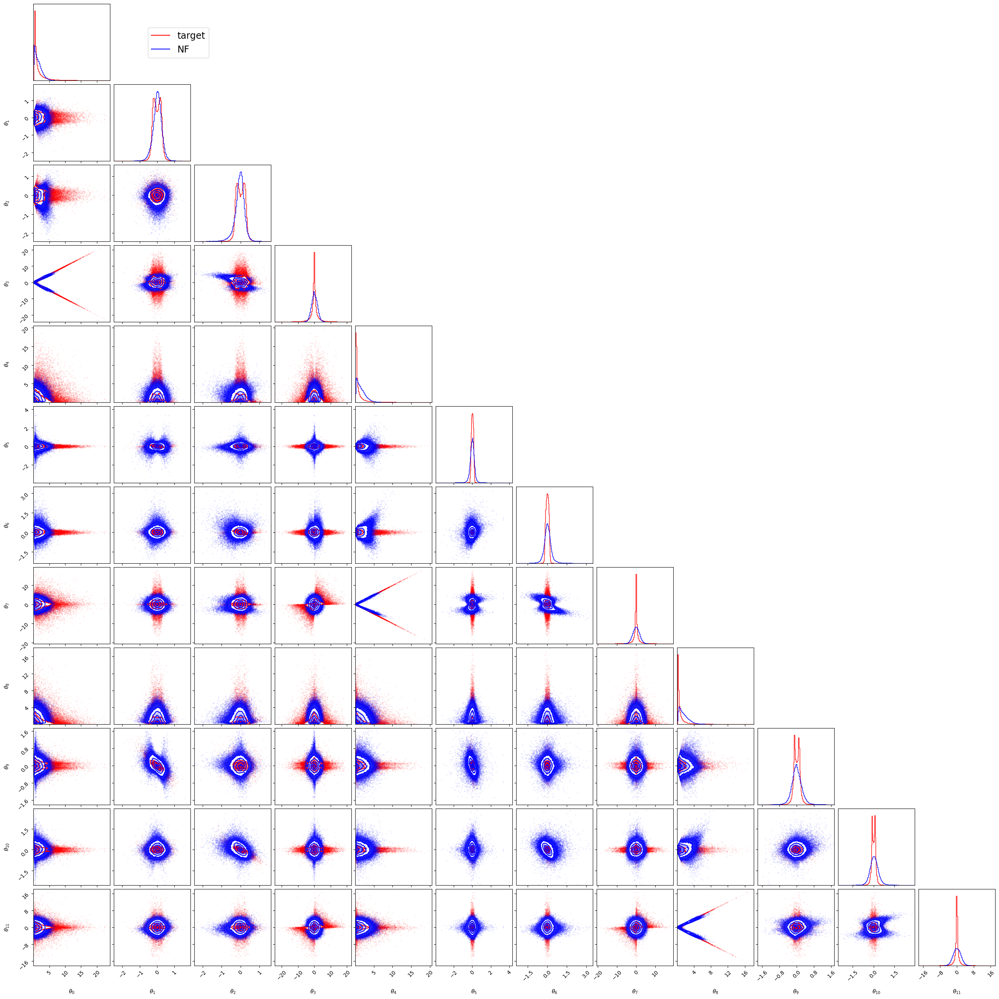

In [19]:
samples_np = samples.numpy()
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np,max_dim=32,n_bins=100)

# Full script for coupling architecture

In [5]:
import CouplingLorentz as Lorentz
from tensorflow.keras.layers import Input
from tensorflow.keras import Model
from tensorflow.keras.callbacks import LambdaCallback

In [6]:
with h5py.File(events_dataset, 'r') as hdf:
    # Loads the datasets from events_dataset file
    events = hdf['Z+1j'][:]
len(events)

3987098

In [7]:
nsamples = 100000
ndims = events.shape[1]
X_data_train = tf.convert_to_tensor(events[:nsamples])
n_particles = int(X_data_train.shape[1]/4)
# Reshape the data to isolate the energies and momenta
reshaped_data = tf.reshape(X_data_train, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute mean energy
mean_energy = tf.reduce_mean(energies)
# Rescale all 4-momenta components by mean energy
X_data_train_std = X_data_train/mean_energy
###
###
# And now compute means3mom and stdev3mom
reshaped_data = tf.reshape(X_data_train_std, [-1, n_particles, 4])
# Split the energies and momenta
energies, px, py, pz = tf.split(reshaped_data, [1, 1, 1, 1], axis=-1)
# Compute the means
mean_energy = tf.reduce_mean(energies)
mean_px = tf.reduce_mean(px)
mean_py = tf.reduce_mean(py)
mean_pz = tf.reduce_mean(pz)
# Compute the standard deviations
std_energy = tf.math.reduce_std(energies)
std_px = tf.math.reduce_std(px)
std_py = tf.math.reduce_std(py)
std_pz = tf.math.reduce_std(pz)
# Combine the means and standard deviations of px, py, and pz
means3mom = tf.stack([mean_px, mean_py, mean_pz], axis=-1)
stdev3mom = tf.stack([std_px, std_py, std_pz], axis=-1)

In [8]:
base_dist = Lorentz.BaseDistribution4Momenta(n_particles=3,means3mom=means3mom,stdev3mom=stdev3mom)

In [9]:
base_dist.log_prob(X_data_train)

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([ -68992.08,  -74002.15, -104883.08, ...,  -81927.95, -132147.5 ,
       -118430.2 ], dtype=float32)>

In [30]:
Lorentz.check_4momentum_conservation(base_dist.sample(10))

The event contains 10 particles
Checking energy-momentum conservation for each event...


{'event:0': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:1': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:2': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:3': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:4': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:5': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:6': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:7': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:8': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False},
 'event:9': {'energy': False,
  'momentum_x': True,
  'momentum_y': True,
  'momentum_z': False}}

In [29]:
Lorentz.compute_masses(base_dist.sample(10))

The event contains 10 particles
Computing masses from on-shell condition


{'event:0': array([0., 0., 0.], dtype=float32),
 'event:1': array([0., 0., 0.], dtype=float32),
 'event:2': array([0., 0., 0.], dtype=float32),
 'event:3': array([0., 0., 0.], dtype=float32),
 'event:4': array([0., 0., 0.], dtype=float32),
 'event:5': array([0., 0., 0.], dtype=float32),
 'event:6': array([0., 0., 0.], dtype=float32),
 'event:7': array([0., 0., 0.], dtype=float32),
 'event:8': array([0., 0., 0.], dtype=float32),
 'event:9': array([0., 0., 0.], dtype=float32)}

In [10]:
n_particles = int(X_data_train_std.shape[1]/4)
n_bijectors = 5*n_particles
hidden_units = [64, 64, 64, 64, 64, 64]
activation = 'relu'

flow = Lorentz.GeneralLorentzNormalizingFlow(n_particles = n_particles, 
                                             n_bijectors = n_bijectors, 
                                             hidden_units = hidden_units, 
                                             activation = activation,
                                             permute_only = False)

In [11]:
nf_dist = tfd.TransformedDistribution(base_dist,flow)

In [12]:
samples = nf_dist.sample(100000)
log_probs = nf_dist.log_prob(samples)
[samples,log_probs]

[<tf.Tensor: shape=(100000, 12), dtype=float32, numpy=
 array([[ 0.48117435,  0.02106239,  0.1486573 , ..., -0.01154513,
         -0.20900843, -0.0054378 ],
        [ 0.14954874, -0.1167598 , -0.07154437, ...,  0.1114129 ,
          0.40004987,  0.5413031 ],
        [ 1.5219917 , -1.1380421 , -0.8591129 , ...,  0.48096687,
          0.15457019, -1.489525  ],
        ...,
        [ 0.9905199 ,  0.53923553, -0.09730319, ..., -0.37926927,
          0.15047207,  0.550441  ],
        [ 0.9140574 , -1.19927   , -0.60407317, ..., -2.369445  ,
          0.3670367 ,  2.5763772 ],
        [ 1.7538567 , -0.65047944, -0.4228427 , ..., -0.23052472,
         -0.53851104,  0.81290334]], dtype=float32)>,
 <tf.Tensor: shape=(100000,), dtype=float32, numpy=
 array([-3.2054105, -4.2778797, -4.96951  , ..., -1.9490161, -4.878932 ,
        -3.7190762], dtype=float32)>]

In [13]:
nf_dist.log_prob(X_data_train)

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([ -1153287.8,  -2641121. , -39139240. , ...,  -6602686. ,
        -6355650. , -15589586. ], dtype=float32)>

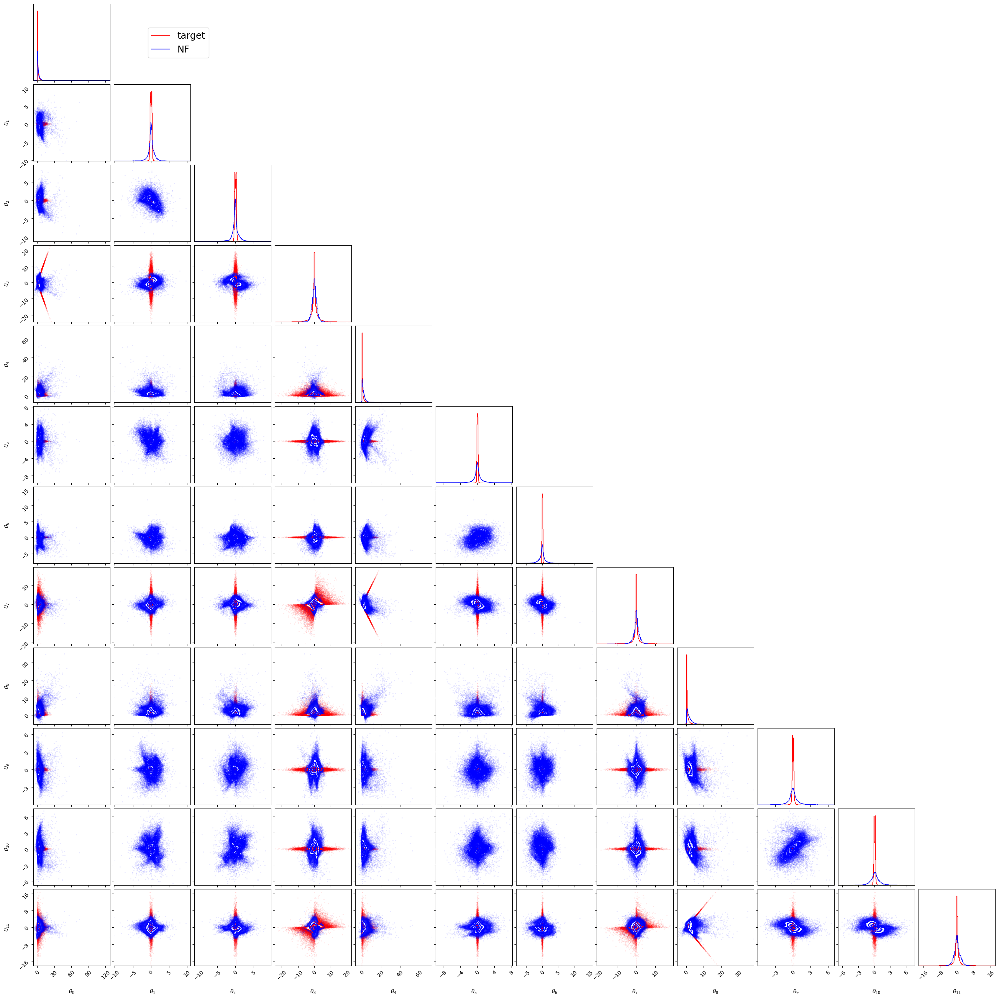

In [14]:
samples_np = samples.numpy()
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np,max_dim=32,n_bins=100)

In [14]:
n_epochs = 1000
batch_size = 512
trainable_distribution = nf_dist
X_data = X_data_train_std
n_disp = 1
path_to_results = results_path
load_weights = False
lr = .0005
patience = 20
min_delta_patience = 0.001
reduce_lr_factor = 0.3
seed = 0
stop_on_nan=False
train_loss = []
val_loss = []
lr_history = []

x_ = Input(shape=(ndims,), dtype=tf.float32)
print(x_)

log_prob_ = trainable_distribution.log_prob(x_)
print('####### log_prob####')
print(log_prob_)
model = Model(x_, log_prob_)

model.compile(optimizer=tf.optimizers.Adam(learning_rate=lr),
              loss=lambda _, log_prob: -log_prob)

#load_weights=True
training_time = 0
train_loss=[]
val_loss=[]
if load_weights==True:
    try:
       model.load_weights(path_to_results+'/model_checkpoint/weights')
       print('Found and loaded existing weights.')
       #nf_dist=loader(nf_dist,load_weights_path)      
    except:
        print('No weights found. Training from scratch.')
        
    try:
        with open(path_to_results+'/details.json', 'r') as f:
            # Load JSON data from file
            json_file = json.load(f)
            train_loss = json_file['train_loss_history']
            val_loss = json_file['val_loss_history']
            training_time = json_file['time']
            print('Found and loaded existing history.')
    except:
        print('No history found. Generating new history.')

ns = X_data.shape[0]
if batch_size is None:
    batch_size = ns

#earlystopping
early_stopping=tf.keras.callbacks.EarlyStopping(
monitor='val_loss', min_delta=min_delta_patience, patience=patience*1.2, verbose=1,
mode='auto', baseline=None, restore_best_weights=True
 )
#reducelronplateau
reducelronplateau=tf.keras.callbacks.ReduceLROnPlateau(
monitor="val_loss", min_delta=min_delta_patience, patience=patience, verbose=1,
factor=reduce_lr_factor, mode="auto", cooldown=0, min_lr=lr/1000
 )
# Display the loss every n_disp epoch
epoch_callback = LambdaCallback(
    on_epoch_end=lambda epoch, logs:
                    print('\n Epoch {}/{}'.format(epoch+1, n_epochs, logs),
                          '\n\t ' + (': {:.4f}, '.join(logs.keys()) + ': {:.4f}').format(*logs.values()))
                                   if epoch % n_disp == 0 else False
)

checkpoint=tf.keras.callbacks.ModelCheckpoint(
path_to_results+'/model_checkpoint/weights',
monitor="val_loss",
verbose=1,
save_best_only=True,
save_weights_only=True,
mode="auto",
save_freq="epoch",
options=None)
            
StopOnNAN=tf.keras.callbacks.TerminateOnNaN()

if stop_on_nan==False:
    callbacks=[epoch_callback,early_stopping,reducelronplateau,checkpoint]
else:
    callbacks=[epoch_callback,early_stopping,reducelronplateau,checkpoint,StopOnNAN]

KerasTensor(type_spec=TensorSpec(shape=(None, 12), dtype=tf.float32, name='input_1'), name='input_1', description="created by layer 'input_1'")
####### log_prob####
KerasTensor(type_spec=TensorSpec(shape=(None,), dtype=tf.float32, name=None), name='tf.__operators__.add_242/AddV2:0', description="created by layer 'tf.__operators__.add_242'")


In [15]:
start = timer()
history = model.fit(x=X_data,
                    y=np.zeros((ns, 0), dtype=np.float32),
                    batch_size=batch_size,
                    epochs=n_epochs,
                    validation_split=0.3,
                    shuffle=True,
                    verbose=2,
                    callbacks=callbacks)
end = timer()
training_time = training_time + end - start

training_timen_loss = train_loss + history.history['loss']
val_loss = val_loss + history.history['val_loss']
lr_history = lr_history + history.history['lr']

print("Trained for",n_epochs,"in",end-start,"s.")

Epoch 1/1000

 Epoch 1/1000 
	 loss: 6.5134, val_loss: 4.5745

Epoch 00001: val_loss improved from inf to 4.57451, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 55s - loss: 6.5134 - val_loss: 4.5745 - lr: 0.0010 - 55s/epoch - 398ms/step
Epoch 2/1000

 Epoch 2/1000 
	 loss: 4.5256, val_loss: 4.3944

Epoch 00002: val_loss improved from 4.57451 to 4.39438, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 27s - loss: 4.5256 - val_loss: 4.3944 - lr: 0.0010 - 27s/epoch - 199ms/step
Epoch 3/1000

 Epoch 3/1000 
	 loss: 4.4299, val_loss: 4.3586

Epoch 00003: val_loss improved from 4.39438 to 4.35855, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 27s - loss: 4.4299 - val_loss: 4.3586 - lr: 0.0010 - 27s/epoch - 200ms/step
Epoch 4/1000

 Epoch 4/1000 
	 loss: 4.3082, val_loss: 4.6896

Epoch 00004: val_loss did not improve from 4.35855
137/137 - 26s - loss: 4.3082 - val_loss: 4.6896 - lr: 0.0010 - 26

137/137 - 27s - loss: 2.7036 - val_loss: 2.6972 - lr: 0.0010 - 27s/epoch - 195ms/step
Epoch 36/1000

 Epoch 36/1000 
	 loss: 2.6814, val_loss: 2.6674

Epoch 00036: val_loss improved from 2.69720 to 2.66743, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 27s - loss: 2.6814 - val_loss: 2.6674 - lr: 0.0010 - 27s/epoch - 195ms/step
Epoch 37/1000

 Epoch 37/1000 
	 loss: 2.6675, val_loss: 2.6862

Epoch 00037: val_loss did not improve from 2.66743
137/137 - 26s - loss: 2.6675 - val_loss: 2.6862 - lr: 0.0010 - 26s/epoch - 191ms/step
Epoch 38/1000

 Epoch 38/1000 
	 loss: 2.7644, val_loss: 2.8090

Epoch 00038: val_loss did not improve from 2.66743
137/137 - 26s - loss: 2.7644 - val_loss: 2.8090 - lr: 0.0010 - 26s/epoch - 190ms/step
Epoch 39/1000

 Epoch 39/1000 
	 loss: 2.7560, val_loss: 2.8763

Epoch 00039: val_loss did not improve from 2.66743
137/137 - 26s - loss: 2.7560 - val_loss: 2.8763 - lr: 0.0010 - 26s/epoch - 188ms/step
Epoch 40/1000

 Epoch 40/1000 


In [14]:
start = timer()
history = model.fit(x=X_data,
                    y=np.zeros((ns, 0), dtype=np.float32),
                    batch_size=batch_size,
                    epochs=n_epochs,
                    validation_split=0.3,
                    shuffle=True,
                    verbose=2,
                    callbacks=callbacks)
end = timer()
training_time = training_time + end - start

training_timen_loss = train_loss + history.history['loss']
val_loss = val_loss + history.history['val_loss']
lr_history = lr_history + history.history['lr']

print("Trained for",n_epochs,"in",end-start,"s.")

Epoch 1/100

 Epoch 1/100 
	 loss: 3.4176, val_loss: 3.5712

Epoch 00001: val_loss did not improve from 3.42147
137/137 - 19s - loss: 3.4176 - val_loss: 3.5712 - lr: 0.0010 - 19s/epoch - 136ms/step
Epoch 2/100

 Epoch 2/100 
	 loss: 3.3919, val_loss: 3.2857

Epoch 00002: val_loss improved from 3.42147 to 3.28569, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 19s - loss: 3.3919 - val_loss: 3.2857 - lr: 0.0010 - 19s/epoch - 138ms/step
Epoch 3/100

 Epoch 3/100 
	 loss: 3.2673, val_loss: 3.2823

Epoch 00003: val_loss improved from 3.28569 to 3.28226, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 19s - loss: 3.2673 - val_loss: 3.2823 - lr: 0.0010 - 19s/epoch - 141ms/step
Epoch 4/100

 Epoch 4/100 
	 loss: 3.2266, val_loss: 3.1793

Epoch 00004: val_loss improved from 3.28226 to 3.17935, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 20s - loss: 3.2266 - val_loss: 3.1793 - lr: 0.0010 - 20s/ep

Epoch 36/100

 Epoch 36/100 
	 loss: 2.7431, val_loss: 2.7952

Epoch 00036: val_loss did not improve from 2.72250
137/137 - 19s - loss: 2.7431 - val_loss: 2.7952 - lr: 0.0010 - 19s/epoch - 141ms/step
Epoch 37/100

 Epoch 37/100 
	 loss: 2.7227, val_loss: 2.7092

Epoch 00037: val_loss improved from 2.72250 to 2.70918, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 19s - loss: 2.7227 - val_loss: 2.7092 - lr: 0.0010 - 19s/epoch - 136ms/step
Epoch 38/100

 Epoch 38/100 
	 loss: 2.8131, val_loss: 3.2067

Epoch 00038: val_loss did not improve from 2.70918
137/137 - 18s - loss: 2.8131 - val_loss: 3.2067 - lr: 0.0010 - 18s/epoch - 129ms/step
Epoch 39/100

 Epoch 39/100 
	 loss: 2.8231, val_loss: 2.8011

Epoch 00039: val_loss did not improve from 2.70918
137/137 - 20s - loss: 2.8231 - val_loss: 2.8011 - lr: 0.0010 - 20s/epoch - 146ms/step
Epoch 40/100

 Epoch 40/100 
	 loss: 2.7593, val_loss: 2.8235

Epoch 00040: val_loss did not improve from 2.70918
137/137 - 1

137/137 - 20s - loss: 2.5500 - val_loss: 2.5285 - lr: 3.0000e-04 - 20s/epoch - 143ms/step
Epoch 72/100

 Epoch 72/100 
	 loss: 2.5290, val_loss: 2.5388

Epoch 00072: val_loss did not improve from 2.52852
137/137 - 18s - loss: 2.5290 - val_loss: 2.5388 - lr: 3.0000e-04 - 18s/epoch - 130ms/step
Epoch 73/100

 Epoch 73/100 
	 loss: 2.5231, val_loss: 2.5215

Epoch 00073: val_loss improved from 2.52852 to 2.52151, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 18s - loss: 2.5231 - val_loss: 2.5215 - lr: 3.0000e-04 - 18s/epoch - 131ms/step
Epoch 74/100

 Epoch 74/100 
	 loss: 2.5031, val_loss: 2.5102

Epoch 00074: val_loss improved from 2.52151 to 2.51021, saving model to ../ZplusJets/results/Lorentz/model_checkpoint/weights
137/137 - 19s - loss: 2.5031 - val_loss: 2.5102 - lr: 3.0000e-04 - 19s/epoch - 140ms/step
Epoch 75/100

 Epoch 75/100 
	 loss: 2.5000, val_loss: 2.5178

Epoch 00075: val_loss did not improve from 2.51021
137/137 - 19s - loss: 2.5000 - val

In [16]:
nf_dist.log_prob(X_data_train)

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([  -379377.56,   -619207.94,  -5384783.  , ...,  -4845661.  ,
       -12025217.  ,  -5838808.  ], dtype=float32)>

In [22]:
nf_dist.log_prob(X_data_train)

<tf.Tensor: shape=(100000,), dtype=float32, numpy=
array([-7.9363731e+05, -1.3896346e+06, -9.4068488e+07, ...,
       -7.4475865e+06, -1.7836312e+07, -1.6402168e+08], dtype=float32)>

In [17]:
samples = nf_dist.sample(100000)

In [24]:
samples[:20]

The event contains 20 particles
Computing masses from on-shell condition


{'event:0': array([0.08847792,        nan, 8.153691  ], dtype=float32),
 'event:1': array([1.0810666, 2.5389276, 1.2912681], dtype=float32),
 'event:2': array([       nan, 3.1252728 , 0.93601114], dtype=float32),
 'event:3': array([1.4831696 , 0.47168928, 0.36621478], dtype=float32),
 'event:4': array([       nan, 0.67100865,        nan], dtype=float32),
 'event:5': array([       nan, 0.83809817, 1.8202283 ], dtype=float32),
 'event:6': array([       nan, 0.17188603,        nan], dtype=float32),
 'event:7': array([1.5442085,       nan,       nan], dtype=float32),
 'event:8': array([      nan, 5.6636953,       nan], dtype=float32),
 'event:9': array([2.727413 ,       nan, 2.2457633], dtype=float32),
 'event:10': array([0.8142083 , 0.20777844, 0.9104842 ], dtype=float32),
 'event:11': array([0.2991894, 2.683678 ,       nan], dtype=float32),
 'event:12': array([0.8177129, 0.6687553, 2.5656593], dtype=float32),
 'event:13': array([      nan, 1.0587363,       nan], dtype=float32),
 'event:1

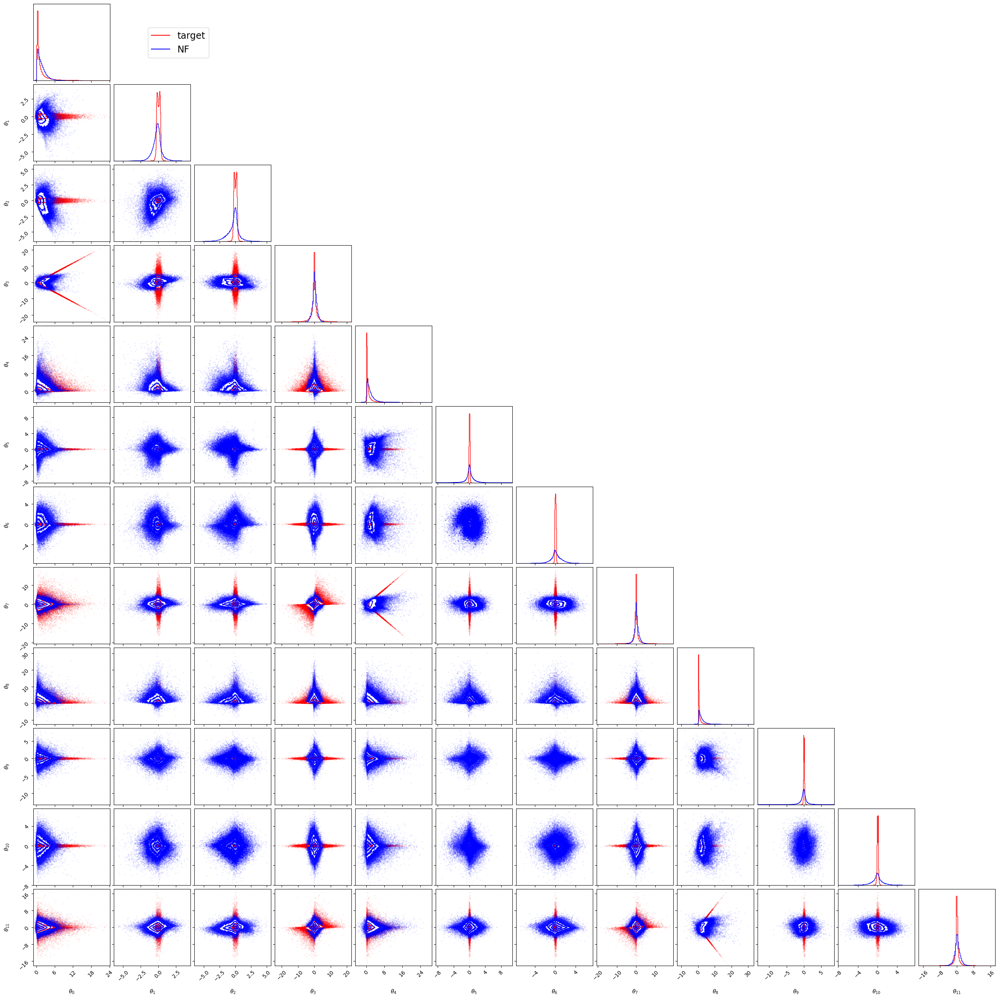

In [18]:
samples_np = samples.numpy()
X_data_train_std_np = X_data_train_std.numpy()
Lorentz.cornerplotter(X_data_train_std_np,samples_np,max_dim=32,n_bins=100)

# Autoregressive architecture

In [13]:
import six
def _create_input_order_old(input_size, input_order='left-to-right', seed=None):
    """Returns a degree vectors for the input."""
    if isinstance(input_order, six.string_types):
        if input_order == 'left-to-right':
            return np.arange(start=1, stop=input_size + 1)
        elif input_order == 'right-to-left':
            return np.arange(start=input_size, stop=0, step=-1)
        elif input_order == 'random':
            ret = np.arange(start=1, stop=input_size + 1)
            if seed is None:
                rng = np.random
            else:
                rng = np.random.RandomState(seed)
            rng.shuffle(ret)
            return ret
    elif np.all(np.sort(np.array(input_order)) == np.arange(1, input_size + 1)):
        return np.array(input_order)
    raise ValueError('Invalid input order: "{}".'.format(input_order))

def _create_degrees_old(input_size,
                    hidden_units=None,
                    input_order='left-to-right',
                    hidden_degrees='equal',
                    seed=None):
    """Returns a list of degree vectors for the given architecture."""
    input_order = _create_input_order(input_size, input_order)
    degrees = [input_order]
    if hidden_units is None:
        hidden_units = []
    for units in hidden_units:
        if isinstance(hidden_degrees, six.string_types):
            if hidden_degrees == 'random':
                if seed is None:
                    rng = np.random
                else:
                    rng = np.random.RandomState(seed)
                # samples from: [low, high)
                degrees.append(
                    rng.randint(low=min(np.min(degrees[-1]), input_size - 1),
                                high=input_size,
                                size=units))
            elif hidden_degrees == 'equal':
                min_degree = min(np.min(degrees[-1]), input_size - 1)
                degrees.append(np.maximum(
                    min_degree,
                    # Evenly divide the range `[1, input_size - 1]` in to `units + 1`
                    # segments, and pick the boundaries between the segments as degrees.
                    np.ceil(np.arange(1, units + 1)
                        * (input_size - 1) / float(units + 1)).astype(np.int32)))
    else:
        raise ValueError('Invalid hidden order: "{}".'.format(hidden_degrees))
    return degrees

def _create_masks_old(degrees):
    """Returns a list of binary mask matrices enforcing autoregressivity."""
    return [
        # Create input->hidden and hidden->hidden masks.
        inp[:, np.newaxis] <= out
          for inp, out in zip(degrees[:-1], degrees[1:])
      ] + [
          # Create hidden->output mask.
          degrees[-1][:, np.newaxis] < degrees[0]
      ]

IndentationError: unexpected indent (1536903594.py, line 57)

In [ ]:
_create_degrees_old(12,
                    hidden_units=24,
                    input_order='left-to-right',
                    hidden_degrees='equal',
                    seed=None)

In [10]:
import six
def _create_input_order_new(input_size, input_order='left-to-right', seed=None):
    """Returns a degree vectors for the input."""
    if isinstance(input_order, six.string_types):
        if input_order == 'left-to-right':
            return np.arange(start=1, stop=input_size//4 + 1).repeat(4)
        elif input_order == 'right-to-left':
            return np.arange(start=input_size//4, stop=0, step=-1).repeat(4)
        elif input_order == 'random':
            ret = np.arange(start=1, stop=input_size//4 + 1).repeat(4)
            if seed is None:
                rng = np.random
            else:
                rng = np.random.RandomState(seed)
            rng.shuffle(ret)
            return ret
    elif np.all(np.sort(np.array(input_order)) == np.arange(1, input_size//4 + 1).repeat(4)):
        return np.array(input_order)
    raise ValueError('Invalid input order: "{}".'.format(input_order))

def _create_degrees_new(input_size,
                    hidden_units=None,
                    input_order='left-to-right',
                    hidden_degrees='equal',
                    seed=None):
    """Returns a list of degree vectors for the given architecture."""
    input_order = _create_input_order(input_size, input_order)
    degrees = [input_order]
    if hidden_units is None:
        hidden_units = []
    for units in hidden_units:
        if isinstance(hidden_degrees, six.string_types):
            if hidden_degrees == 'random':
                if seed is None:
                    rng = np.random
                else:
                    rng = np.random.RandomState(seed)
                # samples from: [low, high)
                degrees.append(
                    rng.randint(low=min(np.min(degrees[-1]), input_size//4 - 1),
                                high=input_size//4,
                                size=units).repeat(4))
            elif hidden_degrees == 'equal':
                min_degree = min(np.min(degrees[-1]), input_size//4 - 1)
                degrees.append(np.maximum(
                    min_degree,
                    # Evenly divide the range `[1, input_size//4 - 1]` in to `units + 1`
                    # segments, and pick the boundaries between the segments as degrees.
                    np.ceil(np.arange(1, units + 1)
                            * (input_size//4 - 1) / float(units + 1)).astype(np.int32)).repeat(4))
        else:
            raise ValueError('Invalid hidden order: "{}".'.format(hidden_degrees))
    return degrees

def _create_masks_new(degrees):
    """Returns a list of binary mask matrices enforcing autoregressivity."""
      return [
          # Create input->hidden and hidden->hidden masks.
          inp[:, np.newaxis] <= out
          for inp, out in zip(degrees[:-1], degrees[1:])
      ] + [
          # Create hidden->output mask.
          degrees[-1][:, np.newaxis] < degrees[0]
      ]

In [11]:
_create_input_order_new(4, input_order='left-to-right', seed=None)

array([1, 1, 1, 1])